<a href="https://colab.research.google.com/github/vadim-privalov/Neiroset_Novosibirsk/blob/main/Lesson_04_Train_yolov3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 style="text-align: center;"><b>Обучение модели YOLO</b></h1>

В этом уроке мы обучим свою собственную модель yolo третьей версии. Почему именно версии 3? Потому что технология нахождения объектов на изображении сама по себе довольно не простая, а ещё и начинать изучения с последних версий будет довольно сложно. На данный момент автор оригинальной yolo Джозеф Редмон перестал заниматся этой технологией, однако сообщество продолжило и развило эту концепцию. Сейчас есть более мощьные yolov4 и yolov5, которые мы рассмотрим в следующих уроках. Сейчас же мы остановимся на yolov3, которой полность хватит чтобы понять принципы, которые стоят за обнаружением объектов в один проход.

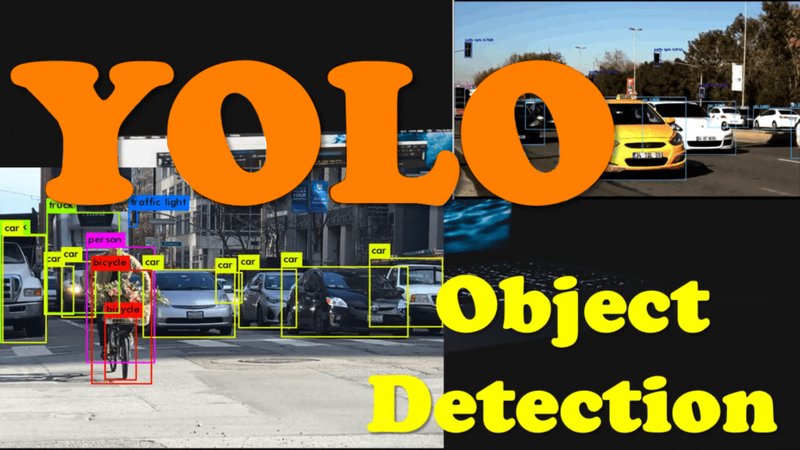

Из предыдущих уроков вы уже знаете как выглядит архитектура сети, как подготавливаются изображения для подачи в сеть, как обрабатывается предсказание сети, и как отображаются результаты. Также вы подробно познакомились и, надеюсь, опробовали на практике как собрать и обработать свой датасет. Теперь мы займёмся самым важным и основным, без чего всё остальное не имеет значения - обучением модели. 

В этом уроке мы разберём как подготовливается датасет  и обрабатываются метки для обучения, как происходит само обучения, и вишенка на торте, то без чего не возможен процесс обучения - функция потерь. Не пережиайте, если не поймёте с первого раза, эта технология не простая как со стороны программного кода, так и математики, на которой всё держится. Для понимания лучше всего пройти все уроки в цикле и потом ещё раз вернутся сюда. Ничего лучше чем сам код не объяснит вам что делается в программе и почему, а мои подробные комментарии немного облегчат вам задачу. Приступим!

В этом уроке нам понадобится графический процессор для ускорения обучения, без него обучение может длиться неделями. Я уверен, что вы уже продвинутый пользователь colaba и сможете сами переключить среду на gpu, но на всякий случай напомню. Для этого нужно в верхней строчке найти пункт "Среда выполнения", внутри неё выбрать пункт "Сменить среду выполнения" и выбрать во вкладке "Аппаратный ускоритель" gpu.

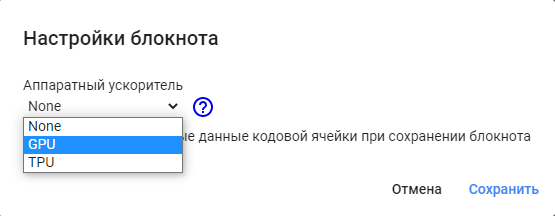

Первое что нужно сделать, это скачать архив с файлами, необъоходимыми для работы урока, и веса оригинальной yolo, что мы и делаем ниже.

In [ ]:
# Скачиваем архив урока.
!wget http://dataudt.ru/datasets/cv/Lesson_04.Train_yolov3.zip
# Распаковываем его.
!unzip -qq Lesson_04.Train_yolov3.zip
# Удаляем архив урока.
!rm Lesson_04.Train_yolov3.zip
# Скачиваем оригинальные веса модели.
!wget -P /content/Lesson_04.Train_yolov3/Model_data https://pjreddie.com/media/files/yolov3.weights 
# Устанавливаем папку проекта.
%cd /content/Lesson_04.Train_yolov3/

--2021-07-22 11:32:23--  http://dataudt.ru/datasets/cv/Lesson_04.Train_yolov3.zip
Resolving dataudt.ru (dataudt.ru)... 37.228.117.130
Connecting to dataudt.ru (dataudt.ru)|37.228.117.130|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 245064093 (234M) [application/zip]
Saving to: ‘Lesson_04.Train_yolov3.zip’

Lesson_04.Train_yol 100%[===================>] 233.71M  22.1MB/s    in 11s     

2021-07-22 11:32:35 (20.8 MB/s) - ‘Lesson_04.Train_yolov3.zip’ saved [245064093/245064093]

--2021-07-22 11:32:38--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘/content/Lesson_04.Train_yolov3/Model_data/yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  40.8MB/s    in 6.1s    

2021-07-22 11:32:45 (38.5 MB/s) - ‘/

Далее нужно установить необходимые модули конкретных версий. Потому что сейчас урок написан на версии tensorflow 2.3.1, а со временем будут выходить новые версии tf и других модулей, из-за этого могут возникнуть проблемы совместимоти.

Вам ничего не нужно устанавлиать вручную, всё сделается автоматически, нужно просто запустить ячейку ниже и **обязательно перезапустить среду после установки** всех модулей, colab сам предложит вам это сделать. 

In [ ]:
!pip install -r ./requirements.txt

     |████████████████████████████████| 320.4 MB 26 kB/s 
     |████████████████████████████████| 320.4 MB 26 kB/s 
     |████████████████████████████████| 59 kB 7.8 MB/s 
     |████████████████████████████████| 3.7 MB 53.7 MB/s 
     |████████████████████████████████| 76 kB 6.5 MB/s 
     |████████████████████████████████| 2.9 MB 53.9 MB/s 
     |████████████████████████████████| 20.1 MB 1.4 MB/s 
     |████████████████████████████████| 459 kB 61.3 MB/s 
     |████████████████████████████████| 79 kB 9.5 MB/s 
     |████████████████████████████████| 7.7 MB 59.8 MB/s 
     |████████████████████████████████| 547 kB 76.2 MB/s 
     |████████████████████████████████| 127 kB 73.5 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9673 sha256=0ab3120caa9bd664708abf34ee54506eaa733fe37c22051fdec46d4f74b0dc10
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    

После перезагрузки скачанные файлы остаются на диске, но папка проекта сбрасывается, поэтому нужно её снова утановить. 

In [ ]:
# Устанавливаем папку проекта.
%cd /content/Lesson_04.Train_yolov3/

# Посмотрим какие файлы и папки есть в архиве урока.
!ls

/content/Lesson_04.Train_yolov3
Checkpoints  dataset.py  Logs	     requirements.txt  yolo.py
configs.py   Datasets	 Model_data  train.py


Теперь, когда рабочие инструменты настроены, посмотрим какой gpu нам достался и его характеристии.

In [ ]:
!nvidia-smi

Thu Jul 22 11:34:29 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Импортируем необходимые модули.

In [ ]:
# Базовые модули.
import os
import shutil
import cv2
import random
import numpy as np
import tensorflow as tf

# Функция для отображений изображений.
from google.colab.patches import cv2_imshow
# Функция для очистки сессии.
from tensorflow.keras.backend import clear_session
# Функция для загрузки модели.
from tensorflow.keras.models import load_model

В этом уроке и так будет много кода, поэтому те функции, которые мы рассмотрели в предыдущих уроках мы просто импортируем из файла, который есть в архиве урока. Со всеми ими вы уже знакомы, большая часть функции вообще не притерпела никаких изменений, а в некоторые было добавлено несколько улучшений, но принцип их работы вообще не изменился, поэтому повторно рассматривать их нет смысла. 

Также в архиве урока представлен полноценный код для обучения модели на своём компьютере с gpu. Здесь всю настройку gpu берёт на себя colab, а локально вам придётся настраивать всё самим. В файлах урока вы найдёте код настройки gpu. Советую настроить и обучить модель на своём компьютере, пройти все этапы самому, это очень полезный навык, только нужно будет заменить путь к изображениям в файлах аннотаций.

In [ ]:
# Импортируем все неоходимые функции с предыдущих уроков.
from yolo import *

# Настройка парамметров проекта.

Ниже представлена кофигурационная ячейка со всеми настройками. Изменяя только её вы можете настроить парамметры под свой проект и не трогать весь остальной код. Все переменные настройки написанны большими буквами для удобства различия. Каждая настройка снабжена комментариями. Некоторые настройки не сразу будут понятны, их мы объясним по ходу рассмотрения кода урока.

Забегая на перёд скажем, что будем обучать модель, которая будет находить и выделять рамкой огонь на изображениях. Это очень хороший пример, так как он не сильно сложный для начала, и хорошо когда приложения имеют какую-нибудь практическую ценность. Относительная несложность обучения состоит в том, что здесь только один класс огонь, и при обучении сети распознавать пламя будет меньше ложных срабатываний, так как в реальной жизни не так много предметов похожих на огонь и модели будет его легче выделить на фоне остальных предметов. Это проект для старта. С набором данных мы познакомимся ниже.

В настройках проекта указаны пути к файлам с аннотациями. Как вы помните из урока по сбору набора данных, в метках формата yolov3 находятся пути к изображениями, координаты ограничивающих рамок и номера классов объектов. 

In [ ]:
# Имя проекта.
PROJECT_NAME       = "fire"
# Тип и версия модели yolo
YOLO_TYPE          = "yolov3"
# Имя модели.
MODEL_NAME         = f"{YOLO_TYPE}_{PROJECT_NAME}"
# Путь к оригинальным весам.
YOLO_V3_WEIGHTS    = "Model_data/yolov3.weights"
# Путь к файлу с списком имён классов COCO.
COCO_CLASSES       = "Model_data/coco.names"
# Шаги разделительной сетки в пикселях для каждого выхода сети.
STRIDES            = [8, 16, 32]
# Пороговое значение коэфициента пересечения, меньше 
# которого считается что в рамке нет объекта.
IOU_LOSS_THRESH    = 0.5
# Количество якорей на один выход сети.
ANCHOR_PER_SCALE   = 3
# Максимальное количество ограничивающих рамок на выход сети.
MAX_BBOX_PER_SCALE = 100
# Размер входа сети (размер входных изображений).
INPUT_IMG_SIZE     = 416

# Якоря для каждого выхода сети.
YOLO_ANCHORS       = [[[10,  13], [16,   30], [33,   23]],
                      [[30,  61], [62,   45], [59,  119]],
                      [[116, 90], [156, 198], [373, 326]]]

# Флаг сохранения только лучшей модели по значению 
# функции потерь на проверочном наборе. Рекомендуется True. 
# Программа будет сравнивать val_loss и сохранять только лучшую.
SAVE_BEST_ONLY     = True
# Флаг сохранения модели после каждой эпохи. Понадобиться много 
# дискового пространства. Рекомендуется False.
SAVE_CHECKPOINT    = False
# Путь к контрольным точкам обучения.
CHECKPOINTS_FOLDER = "Checkpoints"

# Путь к файл со списком имён классов для обучения.
CLASSES_PATH       = "Datasets/fire_dataset/fire_names.txt"
# Путь к файл с аннотациями датасета обучения.
TRAIN_ANNOT_PATH   = "Datasets/fire_dataset/fire_train.txt"
# Путь, где будут сохранятся логи обучения и проверки.
LOGDIR             = "Logs"

# Загрузка изображений в оперативную память. 
# Ускорит обучение, но потребуется много памяти.
LOAD_IMAGES_TO_RAM = True
# Размер пакета для обучения.
TRAIN_BATCH_SIZE   = 4
# Аугментация данных для обучения
TRAIN_DATA_AUG     = True
# Использование предобученых оригинальных весов.
TRAIN_TRANSFER     = True
# Обучение с контрольной точки. Флаг либо путь к чекпоинту.
FROM_CHECKPOINT    = False # или "Checkpoints/fire_yolov3"
# Скорость обучения.
LEARNING_RATE      = 1e-4
# Количество эпох.
EPOCHS             = 20

# Путь к файл с аннотациями для проверочного набора.
TEST_ANNOT_PATH    = "Datasets/fire_dataset/fire_test.txt"
# Размер проверочного пакета.
TEST_BATCH_SIZE    = 4
# Аугментация проверочных данных.
TEST_DATA_AUG      = False

# Оригинальная сеть yolov3.

Чтобы проверить всё ли мы правильно импортировали и настроили, создадим сеть yolov3 с оригинальными весами, как в прошлом уроке. 

In [ ]:
# Создаём модель сети Yolo.
yolo = Create_Yolo(input_size=INPUT_IMG_SIZE)
# Загружаем предобученные оригинальные веса в модель.
load_yolo_weights(yolo, YOLO_V3_WEIGHTS)

Покажем созданной сети примеры изображений классов и посмотрим предсказания. Как вы видите модель правильно обнаруживает и выделяет объекты, значит мы всё правильно настроили.

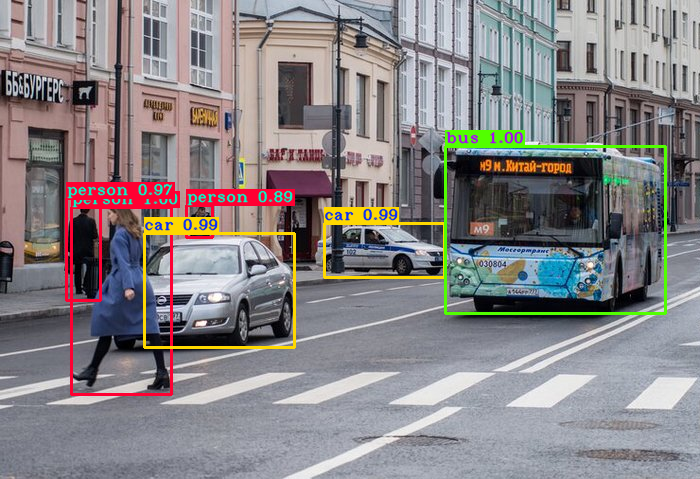

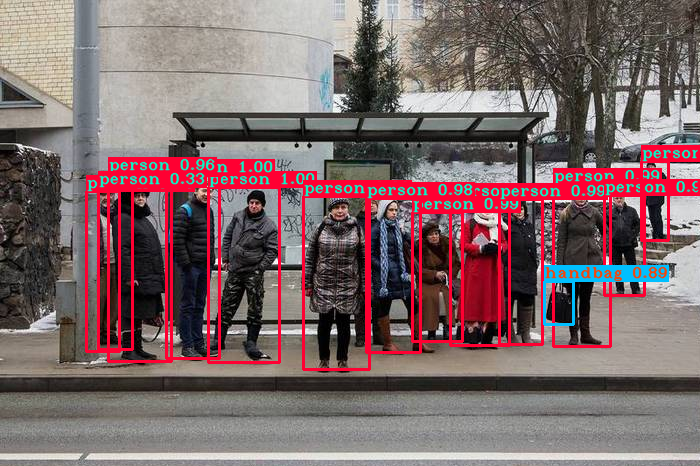

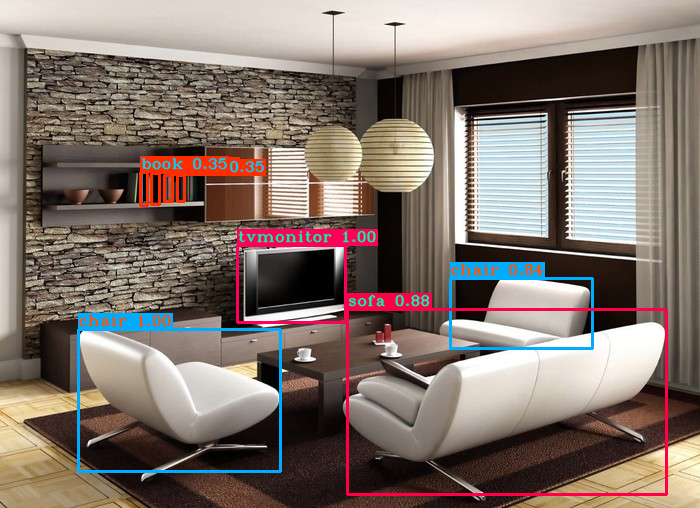

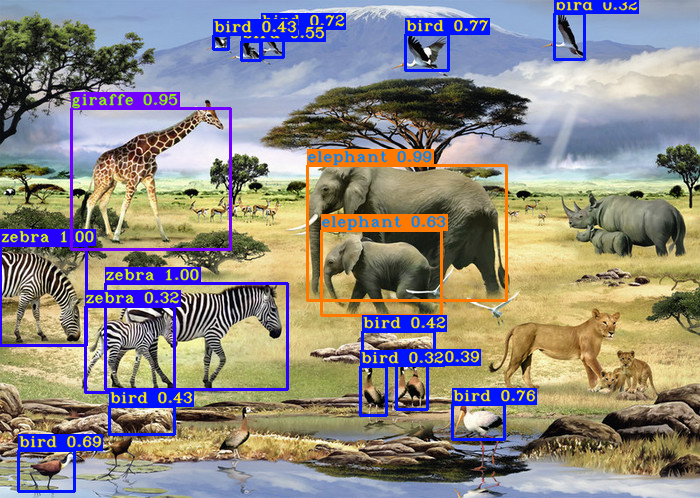

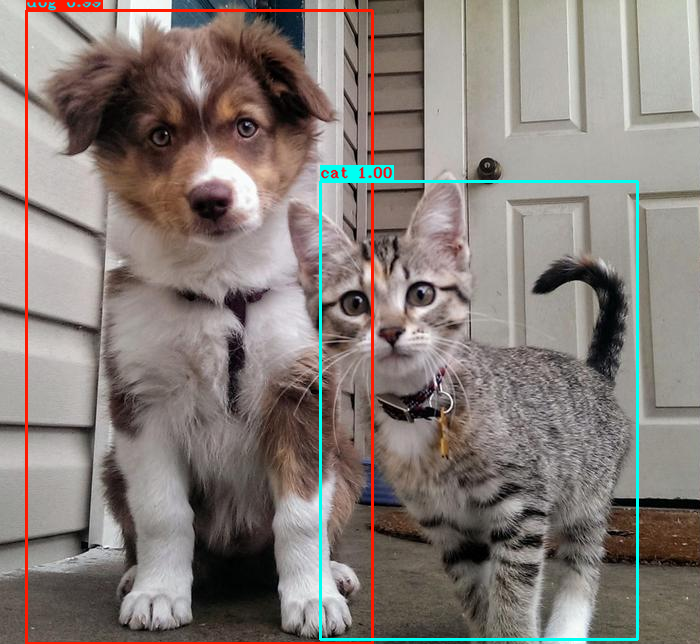

In [ ]:
# Загрузим список наши примеров изображений.
demo_dir = 'Model_data/Demo_images'
images_path_list = [f for f in os.listdir(demo_dir) if os.path.isfile(os.path.join(demo_dir, f))]
images_path_list.sort()

# Подадим на вход сети каждое изображение и 
# отобразим ограничивающие рамки найденных обектов.
for image_path in images_path_list[:5]:
    # Путь к изображению.
    image_path = os.path.join(demo_dir, image_path)

    # Вариант отображения ограничивающих рамок:
    # Каждый класс имеет свой цвет ограничивающей рамки.
    image = detect_image(yolo, image_path, input_size=INPUT_IMG_SIZE)

    # Все объекты помечаются синей ограничивающей рамкой с белым текстом.
    # image = detect_image(yolo, image_path, input_size=INPUT_IMG_SIZE, text_color=(255, 255, 255), rectangle_colors=(255, 0, 0))
    
    # Отобразим выходное изображение.
    cv2_imshow(image)

# Набор данных.

Как говорилось выше, в этом уроке мы будем использовать набор данных с изображениями огня и пожаров. В наборе данных для обучения 727 изображений и 999 меток, а в проверочном наборе 90 изображений и 90 меток.

Отобразим несколько изображений с тренировочного набора.

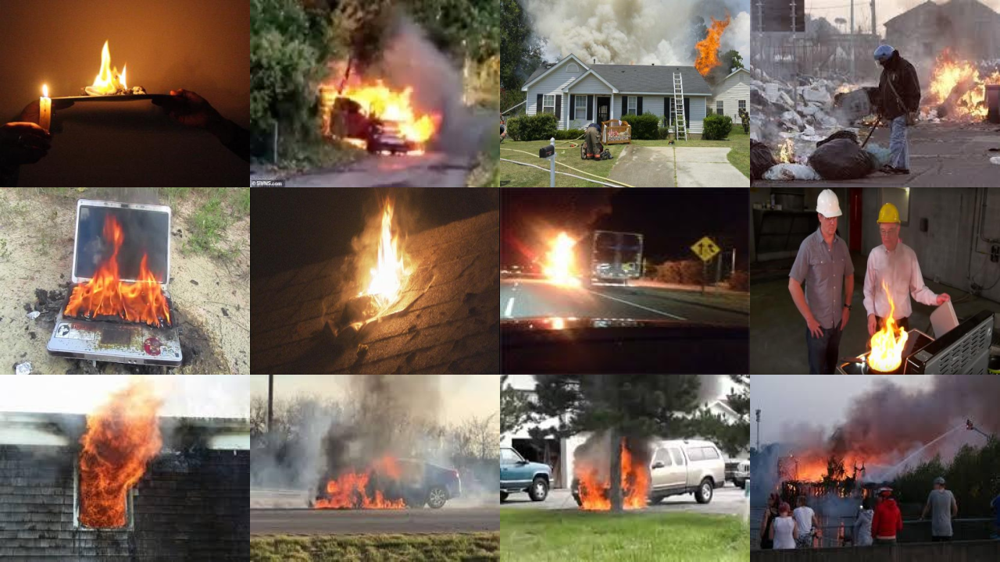

In [ ]:
# Функция для отображения изображений набора данных.
def montage_images(images_path, n_ver, n_hor, re_w=320, re_h=240):
    # images_path - путь к папке с изображениями.
    # n_ver - количество изображений по вертикали.
    # n_hor - количество изображений по горизонтали.
    # re_w и re_h - ширина и высота, к которым 
    # нужно привести размер изображения.

    # Список изображений в папке.
    images_list = [f for f in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, f))]
    # Выделяем память для каркаса изображений.
    frame = np.zeros((n_ver*re_h, n_hor*re_w, 3))

    # Проходим по количеству изображений в каркасе по вертикали
    for v in range(n_ver):
        # и по горизонтали.
        for h in range(n_hor):
            # Случайным образом выбираем изображение
            #  из списка и загружаем его.
            image = cv2.imread(os.path.join(images_path, images_list[random.randint(0, len(images_list))]))
            # Изменяем размер изображения под указанный.
            image = cv2.resize(image, (re_w, re_h), interpolation=cv2.INTER_AREA)
            # Добавляем в карскас изображение.
            frame[v*re_h:(v+1)*re_h, h*re_w:(h+1)*re_w] = image

    # Отображаем созданный каркас изображений.
    cv2_imshow(frame)   

# Указываем путь к изображениям датасета.
dataset_train_dir = 'Datasets/fire_dataset/train'
# Отображаем часть изображений из набора данных.
montage_images(dataset_train_dir, 3, 4)

Создадим класс Dataset, который будет делать все необходимые действия для загрузки, подготовки и аугментаци данных, и передаче их в модель.

In [ ]:
# Создадим класс набора данных.
class Dataset(object):
    # Объявим переменные внутри класса.
    def __init__(self, dataset_type):
        # Путь к текстовому документу с аннотациями.
        self.annot_path  = TRAIN_ANNOT_PATH if dataset_type == 'train' else TEST_ANNOT_PATH
        # Размер изображения входа сети.
        self.input_size = INPUT_IMG_SIZE
        # Размер пакета.
        self.batch_size = TRAIN_BATCH_SIZE if dataset_type == 'train' else TEST_BATCH_SIZE
        # Аугментация данных.
        self.data_aug = TRAIN_DATA_AUG if dataset_type == 'train' else TEST_DATA_AUG
        # Список шагов выходов сети (размер в пикселях
        # ячейки разделительной сетки изображения).
        self.strides = np.array(STRIDES)
        # Список имён классов.
        self.classes = read_class_names(CLASSES_PATH)
        # Количество класссов.
        self.num_classes = len(self.classes)
        # Список якорей.
        self.anchors = (np.array(YOLO_ANCHORS).T/self.strides).T
        # Количество якорей на выход сети.
        self.anchor_per_scale = ANCHOR_PER_SCALE
        # Максимальное количество ограничивающих рамок на выход сети.
        self.max_bbox_per_scale = MAX_BBOX_PER_SCALE
        # Загружаем аннотации.
        self.annotations = self.load_annotations(dataset_type)
        # Количество образцов в датасете.
        self.num_samples = len(self.annotations)
        # Количество пакетов данных.
        self.num_batchs = int(np.ceil(self.num_samples / self.batch_size))
        # Счётчик пакетов.
        self.batch_count = 0
        
    # Функция загрузки аннотаций.
    def load_annotations(self, dataset_type):
        # dataset_type - тип датасета: 'train' или 'test'
        
        # Список для окончательных аннотаций.
        final_annotations = []
        # Считываем текст с файла аннотаций.
        with open(self.annot_path, 'r') as f:
            # Считываем строки.
            txt = f.readlines()
            # Используем строку аннотации, если она имеет метки.
            annotations = [line.strip() for line in txt if len(line.strip().split()[1:]) != 0]
        
        # Перемешиваем аннотации.
        np.random.shuffle(annotations)
        
        # Перебираем строки аннотаций.
        for annotation in annotations:
            # Разделяем строку по пробелам.
            line = annotation.split()
            
            # Задаём начальные значения пути и индекса.
            image_path, index = "", 1
            # Индекс нужен чтобы указать с какого 
            # элемента начинаются координаты.
            
            # Блок кода ниже нужен чтобы сохранить пробелы 
            # в пути после разделения.
            
            # Перебираем все элементы, полученные после разделения.
            for i, one_line in enumerate(line):
                # Убираем запятые в элементе.
                # Если значения элемента не являются цифрами.
                if not one_line.replace(",","").isnumeric():
                    # Если путь к изображению не пустой
                    if image_path != "": 
                        # добавляем к пути пробел.
                        image_path += " "
                    
                    # Добавляем путь к изображению.
                    image_path += one_line
                
                # Если значения элемента являются цифрами,
                # то есть координатами ограничивающей рамки,
                else:
                    # Присваиваем индексу значение номера элемента
                    index = i
                    # и выходим из цикла.
                    break
                    
            # Если нет изображения с таким именем
            if not os.path.exists(image_path):
                # отображаем ошибку.
                raise KeyError("%s does not exist ... " %image_path)
            
            # Нужно ли загружать изображения в оперативную
            # память чтобы ускорить обучение.
            if LOAD_IMAGES_TO_RAM:
                # Открываем и загружаем в память изображение.
                image = cv2.imread(image_path)
            else:
                # Иначе в переменную сохраняем пустую строку.
                image = ''
            
            # Добавляем в аннотации путь к изображению, координаты 
            # ограничивающих рамок объектов и изображение.
            final_annotations.append([image_path, line[index:], image])
        
        # Возвращаем окончательные аннотации.
        return final_annotations
    
    # Чтобы объект класса можно было перебирать 
    # итерацией, определим метод __iter__.
    def __iter__(self):
        return self

    # Функция для удаления ссылок на несуществующие изображения в аннотациях.
    def Delete_bad_annotation(self, bad_annotation):
        # Отображаем строку аннотации, в которой ошибка.
        print(f'Deleting {bad_annotation} annotation line')
        # Сохраняем имя несуществующего изображения.
        bad_image_name = bad_annotation[0].split('/')[-1]

        # Открываем текстовый документ с аннототациями
        # в режиме чтения и записи.
        with open(self.annot_path, "r+") as f:
            # Считываем строки аннотаций.
            d = f.readlines()
            # Возвращаем указатель текущей  
            # позиции на начало файла.
            f.seek(0)
            
            # Перебираем считанные строки.
            for i in d:
                # Если в строке нет имени 
                # несуществующего изображения,
                if bad_image_name not in i:
                    # записываем эту строку в файл.
                    f.write(i)
            
            # Обрезаем файл аннотаций
            # (записываем все строки аннотаций
            # без строк с ошибками).
            f.truncate()
    
    # Объявим метод __next__, который возвращает 
    # следующий доступный элемент из итератора.
    # Подготовим пакет изображений и меток.
    def __next__(self):
        # Для вычислений используем центральный процессор.
        with tf.device('/cpu:0'):
            # Сохраняем список размеров выходов сети.
            # 416 // [8, 16, 32] = [52, 26, 13]
            self.output_sizes = self.input_size // self.strides

            # Выделяем память для пакета изображений
            # формой: размер_пакета, 416, 416, 3.
            batch_image = np.zeros((self.batch_size, self.input_size, self.input_size, 3),
                                    dtype=np.float32)
            
            # Выделяем память для хранения пакета полных меток
            # ограничивающих рамок маленьких объектов
            # формой: размер_пакета, 52, 52, 3, 5+num_classes.
            batch_label_sbbox = np.zeros((self.batch_size, self.output_sizes[0], self.output_sizes[0],
                                          self.anchor_per_scale, 5 + self.num_classes), dtype=np.float32)
            # Пакет полных меток средних объектов
            # формой: размер_пакета, 26, 26, 3, 5+num_classes.
            batch_label_mbbox = np.zeros((self.batch_size, self.output_sizes[1], self.output_sizes[1],
                                          self.anchor_per_scale, 5 + self.num_classes), dtype=np.float32)
            # Пакет полных меток больших объектов
            # формой: размер_пакета, 13, 13, 3, 5+num_classes.
            batch_label_lbbox = np.zeros((self.batch_size, self.output_sizes[2], self.output_sizes[2],
                                          self.anchor_per_scale, 5 + self.num_classes), dtype=np.float32)

            # Резервируем память для хранения пакета ограничивающих
            # рамок объектов разного размера формой:
            # (размер_пакета, макс_кол-во_рамок_на_выход, 4 значения xywh).
            # В нашем случае: (batch_size, 100, 4).
            batch_sbboxes = np.zeros((self.batch_size, self.max_bbox_per_scale, 4), dtype=np.float32)
            batch_mbboxes = np.zeros((self.batch_size, self.max_bbox_per_scale, 4), dtype=np.float32)
            batch_lbboxes = np.zeros((self.batch_size, self.max_bbox_per_scale, 4), dtype=np.float32)
            
            # Флаг появления исключений (ошибок).
            exceptions = False
            
            # Счётчик заполенения пакета
            # изображениями и метками.
            num = 0 
            
            # Если текущее количество пакетов меньше 
            # максимального количества пакетов.
            if self.batch_count < self.num_batchs:
                
                # Пока пакет не заполнен (количество пройденых
                # изображений меньше размера пакета).
                while num < self.batch_size:
                    
                    # Расчитываем текущий индекс шага процесса обучения.
                    # Индекс = текущее значение счётчика пакетов * количество
                    # пакетов и + заполненость текущего пакета.
                    index = self.batch_count * self.batch_size + num
                    
                    # Если индекс больше количества образцов,
                    if index >= self.num_samples: 
                        # тогда от значения индекса отнимаем количество
                        # образцов, чтобы не выйти за допустимую область.
                        index -= self.num_samples
                    
                    # Выбираем аннотацию по индексу и сохраняем.
                    annotation = self.annotations[index]
                    # По аннотации получаем предобработанные 
                    # изображение и ограничивающие прямоугольники.
                    image, bboxes = self.parse_annotation(annotation)
                    
                    # Попробуем преобразовать рамки из аннотаций в виде 
                    # координат в список массивов меток с сетками 
                    # разных размеров и якорями для обучения.
                    # Эти преобразованные значения понадобятся 
                    # для расчёта функции потерь.
                    try:
                        label_sbbox, label_mbbox, label_lbbox, sbboxes, mbboxes, lbboxes = self.preprocess_true_boxes(bboxes)
                    
                    # Если возникнет ошибка при доступе
                    # (индекс вне диапазона допустимых значений), 
                    # то удаляем строку аннотации с ошибкой с файла меток.
                    except IndexError:
                        # Устанавливаем флаг исключения, что произошла ошибка.
                        exceptions = True
                        # Вызываем функцию для удаления проблемной строки меток.
                        self.Delete_bad_annotation(annotation)
                        # Выводим об этом сообщение.
                        print("Возникла проблема с изображением по такому пути", annotation[0], "Удаляем эту строку из файла аннотаций")

                    # Записываем изображение в пакет.
                    batch_image[num, :, :, :] = image
                    # Записываем полные метки в пакет 
                    # для каждого размера.
                    batch_label_sbbox[num, :, :, :, :] = label_sbbox
                    batch_label_mbbox[num, :, :, :, :] = label_mbbox
                    batch_label_lbbox[num, :, :, :, :] = label_lbbox
                    # Записываем ограничивающие рамки в пакет.
                    batch_sbboxes[num, :, :] = sbboxes
                    batch_mbboxes[num, :, :] = mbboxes
                    batch_lbboxes[num, :, :] = lbboxes
                    
                    # Увеличиваем счётчик пройденых 
                    # изображений внутри пакета.
                    num += 1

                # Если флаг ошибки установился.
                if exceptions: 
                    # Выводим сообщение о том, что была ошибка.
                    print('\n')
                    raise Exception("Произошли проблемы с набором данных. Они были устранены. Теперь нужно перезапустить процесс обучения.")
                    
                # Прибавляем к счётчику пакетов ещё один.    
                self.batch_count += 1
                # Объединяем полные метки и метки только ограничивающих рамок
                # в кортежи по размеру: маленькие, средние и большие.
                batch_smaller_target = batch_label_sbbox, batch_sbboxes
                batch_medium_target  = batch_label_mbbox, batch_mbboxes
                batch_larger_target  = batch_label_lbbox, batch_lbboxes

                # Возвращаем пакет изображений и кортеж с метками
                # для трёх размеров выходов сети.
                return batch_image, (batch_smaller_target, batch_medium_target, batch_larger_target)
            
            # Если мы перебрали все пакеты, 
            else:
                # то обнуляем счётчик пакетов и
                self.batch_count = 0
                # перемешиваем строки аннотаций.
                np.random.shuffle(self.annotations)
                # Этой строкой мы сообщаем итератору, 
                # что больше не нужно ничего возвращать.
                raise StopIteration
                
    # Функция отражения по горизонтали
    # изображения и ограничивающих рамок.
    def random_horizontal_flip(self, image, bboxes):
        # В половине случаев производим отражение.
        if random.random() < 0.5:
            # Определяем ширину изображения.
            _, w, _ = image.shape
            # Отражаем изображение по горизонтали.
            image = image[:, ::-1, :]
            # Таким же образом преобразовываем координаты
            # ограничивающих рамок после отражения.
            bboxes[:, [0,2]] = w - bboxes[:, [2,0]]
        
        # Возвращаем отражённые данные.
        return image, bboxes

    # Функция случайного обрезания изображения.
    def random_crop(self, image, bboxes):
        # В половине случаев производим обрезание.
        if random.random() < 0.5:
            # Определяем высоту и ширину изображения.
            h, w, _ = image.shape
            
            # Вычисляем минимальные и максимальные координаты 
            # среди ограничивающих рамок, чтобы не обрезать объекты.
            max_bbox = np.concatenate([np.min(bboxes[:, 0:2], axis=0), 
                                       np.max(bboxes[:, 2:4], axis=0)], axis=-1)
            
            # Вычисляем допустимые границы (расстояние
            # от границы до пределов изображения).
            max_l_trans = max_bbox[0]     # левая граница
            max_u_trans = max_bbox[1]     # верхняя граница
            max_r_trans = w - max_bbox[2] # правая граница
            max_d_trans = h - max_bbox[3] # нижняя граница  
            
            # Расчитываем случайные границы в пределах допустимых.
            crop_xmin = max(0, int(max_bbox[0] - random.uniform(0, max_l_trans))) # левая граница
            crop_ymin = max(0, int(max_bbox[1] - random.uniform(0, max_u_trans))) # верхняя граница
            crop_xmax = min(w, int(max_bbox[2] + random.uniform(0, max_r_trans))) # правая граница
            crop_ymax = min(h, int(max_bbox[3] + random.uniform(0, max_d_trans))) # нижняя граница

            # Вырезаем изображение по случайным границам.
            image = image[crop_ymin : crop_ymax, crop_xmin : crop_xmax]

            # Корректируем координаты рамок, чтобы 
            # соответствовали обрезанному изображению.
            bboxes[:, [0, 2]] = bboxes[:, [0, 2]] - crop_xmin
            bboxes[:, [1, 3]] = bboxes[:, [1, 3]] - crop_ymin

        # Возвращаем подрезанные изображение и рамки.
        return image, bboxes

    # Функция для случайного сдвига изображения.
    def random_translate(self, image, bboxes):
        # В половине случаев производим преобразование.
        if random.random() < 0.5:
            # Определяем высоту и ширину изображения.
            h, w, _ = image.shape
            
            # Вычисляем минимальные и максимальные координаты среди 
            # ограничивающих рамок, чтобы не обрезать объекты при сдвиге.
            max_bbox = np.concatenate([np.min(bboxes[:, 0:2], axis=0), np.max(bboxes[:, 2:4], axis=0)], axis=-1)
            
            # Вычисляем допустимые границы (расстояние
            # от границы до пределов изображения).
            max_l_trans = max_bbox[0]     # левая граница
            max_u_trans = max_bbox[1]     # верхняя граница
            max_r_trans = w - max_bbox[2] # правая граница
            max_d_trans = h - max_bbox[3] # нижняя граница

            # Генерируем случайное значение сдвига в диапазоне допуcтимых границ вдоль оси х и y.
            tx = random.uniform(-(max_l_trans - 1), (max_r_trans - 1))
            ty = random.uniform(-(max_u_trans - 1), (max_d_trans - 1))

            # Формируем матрицу преобразования.
            M = np.array([[1, 0, tx], [0, 1, ty]])
            
            # С помощью аффинного преобразования сдвигаем
            # изображение в случайном направлении.
            image = cv2.warpAffine(image, M, (w, h))

            # Таким же образом сдвигаем ограничивающие рамки.
            bboxes[:, [0, 2]] = bboxes[:, [0, 2]] + tx
            bboxes[:, [1, 3]] = bboxes[:, [1, 3]] + ty

        # Возвращаем сдвинутые изображение и рамки.
        return image, bboxes
    
    # Функция для преобразования аннотации в
    # предобработанные изображение и ограничивающие рамки.
    def parse_annotation(self, annotation):
        # Если загрузили изображения в операивную память,
        if LOAD_IMAGES_TO_RAM:
            # берём путь из аннотации
            image_path = annotation[0]
            # и сохраняем ссылку на загруженное изображение.
            image = annotation[2]
            
        # Если не загружали в память,
        else:
            # берём путь из аннотации,
            image_path = annotation[0]
            # открываем и загружаем изображение.
            image = cv2.imread(image_path)
            
        # Разделяем координаты рамки и преобразовываем 
        # из текстового представления в numpy массив.
        bboxes = np.array([list(map(int, box.split(','))) for box in annotation[1]])

        # Если нужно, выполним аугментацию данных.
        if self.data_aug:
            # Выполняем горизонтальное отражение.
            image, bboxes = self.random_horizontal_flip(np.copy(image), np.copy(bboxes))
            # Случайно обрезаем изображение.
            image, bboxes = self.random_crop(np.copy(image), np.copy(bboxes))
            # Сдвигаем изображение в случайном направлении.
            image, bboxes = self.random_translate(np.copy(image), np.copy(bboxes))
        
        # Производим предобработку изображения и ограничивающих прямоугольников.
        image, bboxes = image_preprocess(np.copy(image), [self.input_size, self.input_size], 
                                         np.copy(bboxes))
        # Возвращаем обработанные изображение и рамки.
        return image, bboxes

    # Функция для подготовки правильных меток 
    # ограничивающих рамок для обучения.
    def preprocess_true_boxes(self, bboxes):
        # Создаём список из трёх numpy массивов для хранения меток, 
        # который по форме совпадает с декодированным выходом сети.
        # [[52, 52, 3, 5+num_classes],
        #  [26, 26, 3, 5+num_classes],
        #  [13, 13, 3, 5+num_classes]]
        # По сути создаём список из трёх разделительных сеток c якорями.
        label = [np.zeros((self.output_sizes[i], self.output_sizes[i], self.anchor_per_scale,
                           5 + self.num_classes)) for i in range(3)]
                           
        # Также зарезервируем массив для хранения ограничивающих рамок объектов.
        # Это будет список из трёх массивов numpy формами:
        # максимальное количество ограничивающих рамок и (x y w h),
        # в нашем случае 3 x 100 х 4.
        bboxes_xywh = [np.zeros((self.max_bbox_per_scale, 4)) for _ in range(3)]
        
        # Создадим массив для подсчёта количества рамок на каждый выход сети.
        bbox_count = np.zeros((3,))

        # Перебираем ограничивающие рамки.
        for bbox in bboxes:
            # Сохраняем координаты рамки
            bbox_coor = bbox[:4]
            # и индекс класса объекта.
            bbox_class_ind = bbox[4]

            # Перевеодим метку класса объекта в формат one hot encoding.
            # Создаём массив нулей размером равным количеству классов
            onehot = np.zeros(self.num_classes, dtype=np.float)
            # и по индексу класса записываем 1 в этот массив.
            onehot[bbox_class_ind] = 1.0
            
            # Создаём массив размером равным количеству классов и 
            # заполняем его единица делённая на количество классов.
            # В нашем случае 1/1 = 1. Заполняем еденицами.
            uniform_distribution = np.full(self.num_classes, 1.0 / self.num_classes)
            
            # Сглаживаем метки в формате OHE, чтобы у нас были 
            # не 0 и 1, а 0.99 где есть класс и 0.01 где нет.
            deta = 0.01 # Значение вместо 0, где нет объекта этого класса.
            smooth_onehot = onehot * (1 - deta) + deta * uniform_distribution

            # Переводим формат ограничивающих рамок
            # из координат границ в центр, ширину и высоту.
            # xmin ymin xmax ymax -> x y w h.
            bbox_xywh = np.concatenate([(bbox_coor[2:] + bbox_coor[:2]) * 0.5, 
                                         bbox_coor[2:] - bbox_coor[:2]], axis=-1)
                                         
            # Масштабируем ограничивающую рамку под каждый выход сети
            # относительно размера ячейки сетки выхода.
            # x y w h / [8, 16, 32]
            # Например, для объекта с координатами x y w h
            # [208, 208, 40, 80] / 8  = [26,  26,  5,    10 ]
            # [208, 208, 40, 80] / 16 = [13,  13,  2.5,  5  ]
            # [208, 208, 40, 80] / 32 = [6.5, 6.5, 1.25, 2.5]
            # То есть мы переводим из координат по пикселям
            # в координаты по разделительной сетке изображения.
            bbox_xywh_scaled = 1.0 * bbox_xywh[np.newaxis, :] / self.strides[:, np.newaxis]

            # Создаём пустой общий список коэффициентов пересечений.
            iou = []
            # Создадим флаг есть ли необходимое пересечение.
            exist_positive = False
            # Перебираем номера выходов сети.
            for i in range(3):
                # Создаём массив для хранения якорей размером 3 на 4
                # (количество якорей на выход сети и x y w h якорей).
                anchors_xywh = np.zeros((self.anchor_per_scale, 4))
                
                # Масштабированные относительно сетки значения координат центра 
                # ограничивающей рамки округляем до наименьшего целого числа и + 0.5, 
                # чтобы центр объекта совпадал с центром ячейки сетки.
                # Записываем в пустой массив якорей.
                anchors_xywh[:, 0:2] = np.floor(bbox_xywh_scaled[i, 0:2]).astype(np.int32) + 0.5
                # В места в массиве для ширины и высоты
                # записываем ширину и высоту якорей.
                anchors_xywh[:, 2:4] = self.anchors[i]

                # Вычисляем коэффициенты пересечения масштабированных 
                # ограничивающих рамок с якорями для каждого выхода сети.
                iou_scale = bbox_xywh_iou(bbox_xywh_scaled[i][np.newaxis, :], anchors_xywh)
                # Добавляем их в общий список коэффициентов пересечений.
                iou.append(iou_scale)
                
                # Создадим маску с условием, чтобы выбрать рамки 
                # с коэффициентом пересечения больше 0.3
                iou_mask = iou_scale > 0.3

                # Если хотя бы один коэффициент подпадает под условие маски.
                if np.any(iou_mask):
                    # Вычисляем индексы ячейки сетки.
                    xind, yind = np.floor(bbox_xywh_scaled[i, 0:2]).astype(np.int32)
                
                    # Записываем в метку по номеру выхода сети
                    # и только в те ячейки, у которых iou > 0.3.
                    # Присваиваем нули всем значениям.
                    label[i][yind, xind, iou_mask, :] = 0
                    # В место для координат ограничивающей рамки записываем 
                    # координаты прямоугольника объекта в формате x y w h.
                    label[i][yind, xind, iou_mask, 0:4] = bbox_xywh
                    # В место для показателя уверенности что
                    # в рамке есть объект записываем 1.
                    label[i][yind, xind, iou_mask, 4:5] = 1.0
                    # В место для вероятности классов объектов записываем 
                    # сглаженные метки классов в формате smooth OHE.
                    label[i][yind, xind, iou_mask, 5:] = smooth_onehot
                    
                    # Ограничиваем индекс рамки максимальным допустимым количеством.
                    # В нашем случаем не больше 100 на каждый выход.
                    bbox_ind = int(bbox_count[i] % self.max_bbox_per_scale)
                    # Записываем координаты ограничивающей рамки по индексу.
                    bboxes_xywh[i][bbox_ind, :4] = bbox_xywh
                    # Прибавляем к счётчику записанных рамок ещё одну.
                    bbox_count[i] += 1

                    # Устанавливаем флаг, что есть необходимое пересечение.
                    exist_positive = True
            
            # Если всё таки нет рамок с коэф. пересечения > 0.3.
            if not exist_positive:
                
                # Находим индекс с максимальным коэф. пересечения среди всех.
                best_anchor_ind = np.argmax(np.array(iou).reshape(-1), axis=-1)
                
                # Делим этот индекс на количество якорей на выход сети (/3)
                # и оставляем целую часть, чтобы получить номер выхода.
                best_detect = int(best_anchor_ind / self.anchor_per_scale)
                # Берём целую часть от остатка от деления индекса на количество 
                # якорей на выход сети (%3), чтобы получить номер якоря.
                best_anchor = int(best_anchor_ind % self.anchor_per_scale)
                
                # Вычисляем индексы ячейки сетки с наилучшим пересечением.
                xind, yind = np.floor(bbox_xywh_scaled[best_detect, 0:2]).astype(np.int32)

                # Записываем в метку по лучшему выходу сети по пересечению
                # и только в ячейку с наилучшим пересечением с якорем.
                # Присваиваем нули всем значениям.
                label[best_detect][yind, xind, best_anchor, :] = 0
                # В место для координат ограничивающей рамки записываем 
                # координаты прямоугольника объекта в формате x y w h.
                label[best_detect][yind, xind, best_anchor, 0:4] = bbox_xywh
                # В место для показателя уверенности что
                # в рамке есть объект записываем 1.
                label[best_detect][yind, xind, best_anchor, 4:5] = 1.0
                # В место для вероятности классов объектов записываем 
                # сглаженные метки классов в формате smooth OHE.
                label[best_detect][yind, xind, best_anchor, 5:] = smooth_onehot

                # Ограничиваем индекс рамки максимальным допустимым количеством.
                # В нашем случаем не больше 100 на каждый выход.
                bbox_ind = int(bbox_count[best_detect] % self.max_bbox_per_scale)
                # Записываем координаты ограничивающей рамки 
                # по лучшему выходу сети по пересечению.
                bboxes_xywh[best_detect][bbox_ind, :4] = bbox_xywh
                # Прибавляем к счётчику записанных рамок ещё одну.
                bbox_count[best_detect] += 1
        
        # Разделяем и сохраняем полные метки и ограничивающие 
        # прямоугольники по размерам выходов сети.
        # Маленькие, средние и большие объекты с рамками.
        label_sbbox, label_mbbox, label_lbbox = label
        sbboxes, mbboxes, lbboxes = bboxes_xywh
        
        # Возвращаем полные метки и огр.рамки по трём размерам.
        return label_sbbox, label_mbbox, label_lbbox, sbboxes, mbboxes, lbboxes
    
    # Чтобы можно было получить длинну объекта 
    # при запросе, определим метод __len__.
    def __len__(self):
        # Возвращаем количество пакетов.
        return self.num_batchs

# Аугментация данных.

Внутри класса Dataset уже встроена уагментация данных, её можно включить или отключить в настройках проекта. Здесь мы используем нейтральные виды аугментации для object detection: отражение изображения по горизонтали, обрезание и сдвиг изображения. В большей части задач эти методы не приведут к изменению сути картинки.Подходящие и эффективные способы аугментации изображений очень зависят от конкретной задачи. Например, если вам нужно находить автомобили на изображениях, то горизонтальное отражение вам поможет, а отражение по вертикали только навредит, потому что в реальной жизни очень мало ситуаций, в которых автомобиль может быть вверх колёсами. С другой строны, если вы будте искать цифры или буквы на изображениях, то отражение вам всё испортит, здесь лучше использовать вращение изображений на небольшие углы. Вращение, а в некоторых задачах и полные повороты, могут помочь повысить точность на проверочном наборе, однако изменение изображения также требует такое же изменение ограничивающей рамки, что иногда бывает не так просто реализовать. В зависимоти от вашей задачи вы можете дописать необходимые способы расширения данных.

Ниже представлен код для демнострации аугментации и подготовки изображения перед подачей в сеть.


Оригинальное изображение
Ограничивающая рамка: [260 193 366 383]


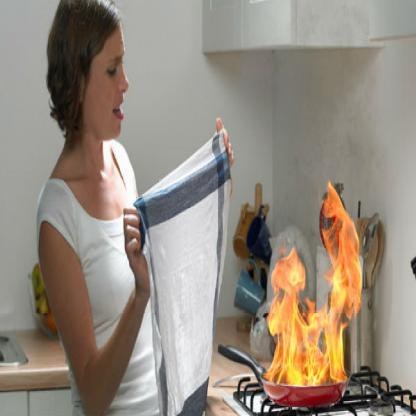


Отражённое по горизонтали изображение
Ограничивающая рамка: [ 50 193 156 383]


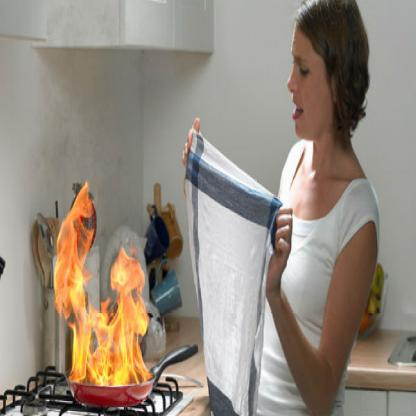


Обрезанное изображение
Ограничивающая рамка: [ 19  93 125 283]


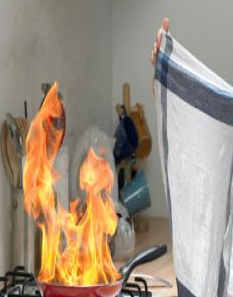


Сдвинутое изображение
Ограничивающая рамка: [ 83  28 189 218]


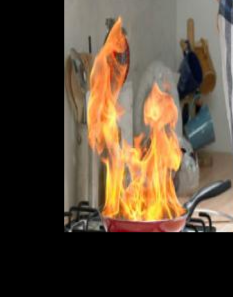


Предобработанное изображение
Ограничивающая рамка: [161  39 309 305]


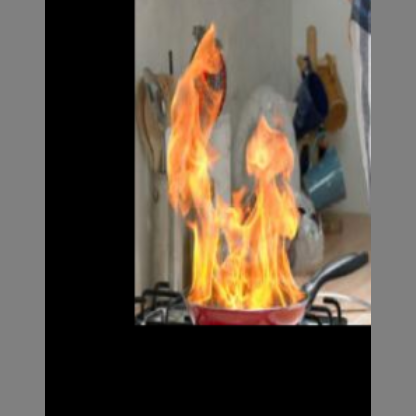


Оригинальное изображение с рамками
Ограничивающая рамка: [260. 193. 366. 383.]


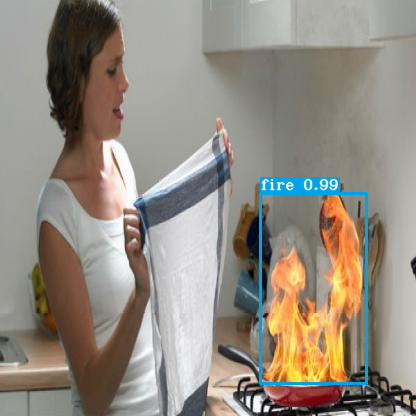

In [ ]:
# Функция отражения по горизонтали
# изображения и ограничивающих рамок.
def random_horizontal_flip(image, bboxes):
    # Определяем ширину изображения.
    _, w, _ = image.shape
    # Отражаем изображение по горизонтали.
    image = image[:, ::-1, :]
    # Таким же образом преобразовываем координаты
    # ограничивающих рамок после отражения.
    bboxes[:, [0,2]] = w - bboxes[:, [2,0]]

    # Возвращаем отражённые данные.
    return image, bboxes

# Функция случайного обрезания изображения.
def random_crop(image, bboxes):
    # Определяем высоту и ширину изображения.
    h, w, _ = image.shape

    # Вычисляем минимальные и максимальные координаты 
    # среди ограничивающих рамок, чтобы не обрезать объекты.
    max_bbox = np.concatenate([np.min(bboxes[:, 0:2], axis=0), 
                                np.max(bboxes[:, 2:4], axis=0)], axis=-1)

    # Вычисляем допустимые границы (расстояние
    # от границы до пределов изображения).
    max_l_trans = max_bbox[0]     # левая граница
    max_u_trans = max_bbox[1]     # верхняя граница
    max_r_trans = w - max_bbox[2] # правая граница
    max_d_trans = h - max_bbox[3] # нижняя граница  

    # Расчитываем случайные границы в пределах допустимых.
    crop_xmin = max(0, int(max_bbox[0] - random.uniform(0, max_l_trans))) # левая граница
    crop_ymin = max(0, int(max_bbox[1] - random.uniform(0, max_u_trans))) # верхняя граница
    crop_xmax = min(w, int(max_bbox[2] + random.uniform(0, max_r_trans))) # правая граница
    crop_ymax = min(h, int(max_bbox[3] + random.uniform(0, max_d_trans))) # нижняя граница

    # Вырезаем изображение по случайным границам.
    image = image[crop_ymin : crop_ymax, crop_xmin : crop_xmax]

    # Корректируем координаты рамок, чтобы 
    # соответствовали обрезанному изображению.
    bboxes[:, [0, 2]] = bboxes[:, [0, 2]] - crop_xmin
    bboxes[:, [1, 3]] = bboxes[:, [1, 3]] - crop_ymin

    # Возвращаем подрезанные изображение и рамки.
    return image, bboxes

# Функция для случайного сдвига изображения.
def random_translate(image, bboxes):
    # В половине случаев производим преобразование.
    if random.random() < 0.5:
        # Определяем высоту и ширину изображения.
        h, w, _ = image.shape
        
        # Вычисляем минимальные и максимальные координаты среди 
        # ограничивающих рамок, чтобы не обрезать объекты при сдвиге.
        max_bbox = np.concatenate([np.min(bboxes[:, 0:2], axis=0), np.max(bboxes[:, 2:4], axis=0)], axis=-1)
        
        # Вычисляем допустимые границы (расстояние
        # от границы до пределов изображения).
        max_l_trans = max_bbox[0]     # левая граница
        max_u_trans = max_bbox[1]     # верхняя граница
        max_r_trans = w - max_bbox[2] # правая граница
        max_d_trans = h - max_bbox[3] # нижняя граница

        # Генерируем случайное значение сдвига в диапазоне допуcтимых границ вдоль оси х и y.
        tx = random.uniform(-(max_l_trans - 1), (max_r_trans - 1))
        ty = random.uniform(-(max_u_trans - 1), (max_d_trans - 1))

        # Формируем матрицу преобразования.
        M = np.array([[1, 0, tx], [0, 1, ty]])
        
        # С помощью аффинного преобразования сдвигаем
        # изображение в случайном направлении.
        image = cv2.warpAffine(image, M, (w, h))

        # Таким же образом сдвигаем ограничивающие рамки.
        bboxes[:, [0, 2]] = bboxes[:, [0, 2]] + tx
        bboxes[:, [1, 3]] = bboxes[:, [1, 3]] + ty

    # Возвращаем сдвинутые изображение и рамки.
    return image, bboxes

# Функция предобработки входного изображения и рамки.
def image_preprocess_demo(image, target_size, gt_boxes=None):
    # image - исходное изображение
    # target_size - размер, к которому нужно привести изображение
    # gt_boxes - ограничивающие рамки, которые тоже нужно 
    # преобразовать относительно изменённого изображения.
    
    # Размеры, к которым нужно привести изображение.
    ih, iw = target_size
    # Текущие размеры изображения.
    h,  w, _ = image.shape

    # Расчитываем масштаб изменения размера.
    scale = min(iw/w, ih/h)
    # Умножаем значение ширины и высоты изображения на масштаб.
    nw, nh  = int(scale * w), int(scale * h)
    # Изменяем размер изображения к необходимому.
    image_resized = cv2.resize(image, (nw, nh))

    # Создаём пустое изображение, заполненое серым цветом.
    image_paded = np.full(shape=[ih, iw, 3], fill_value=128.0)

    # Расчитываем координаты куда копировать масштабированное
    # изображение, чтобы оно было по центру.
    dw, dh = (iw - nw) // 2, (ih-nh) // 2
    
    # Копируем масштабированное изображение в пустое серое.
    image_paded[dh:nh+dh, dw:nw+dw, :] = image_resized
   
    # Если ограничивающие рамки определены, то
    # их тоже нужно преобразовать относительно
    # необходимого размера.
    if gt_boxes is None:
        # Возвращаем только преобразованное изображение.                                            
        return image_paded
    else:
        # Масштабируем и сдвигаем рамки.
        gt_boxes[:, [0, 2]] = gt_boxes[:, [0, 2]] * scale + dw
        gt_boxes[:, [1, 3]] = gt_boxes[:, [1, 3]] * scale + dh
        
        # Возвращаем преобразованное изображение и рамки.
        return image_paded, gt_boxes

# Зафиксируем зерно случайного генератора.
# Можете убрать фиксацию и посмотреть разные варианты 
# преобразования изображения и ограничивающей рамки.
random.seed(16)
# Укажем путь к изображению.
demo_img_path = 'Datasets/fire_dataset/train/ft_0508.jpg'
# Загрузим изображение из набора данных.
orig_image = cv2.imread(demo_img_path)
# Для примера вручную запишем значения параметров 
# ограничивающей рамки для этого изображения.
orig_box = np.array([[260, 193, 366, 383]]) 
# Отобразим оригинальное изображение и рамку.
print('\nОригинальное изображение')
print('Ограничивающая рамка:', orig_box[0])
cv2_imshow(orig_image) 

# Отражение изображения по горизонтали.
flip_img, flip_box = random_horizontal_flip(orig_image, orig_box)
print('\nОтражённое по горизонтали изображение')
print('Ограничивающая рамка:', flip_box[0])
cv2_imshow(flip_img) 

# Случайное обрезание изображения.
crop_img, crop_box = random_crop(flip_img, flip_box)
print('\nОбрезанное изображение')
print('Ограничивающая рамка:', crop_box[0])
cv2_imshow(crop_img) 

# Сдвиг изображения в случайном направлении.
translate_img, translate_box = random_translate(crop_img, crop_box)
print('\nСдвинутое изображение')
print('Ограничивающая рамка:', translate_box[0])
cv2_imshow(translate_img) 

# Предобработка изображения и рамки перед подачей в сеть.
preprocess_img, preprocess_box = image_preprocess_demo(translate_img, (416, 416), gt_boxes=translate_box)
print('\nПредобработанное изображение')
print('Ограничивающая рамка:', preprocess_box[0])
cv2_imshow(preprocess_img)

# Нарисуем ограничивающую рамку
# на изображении и выведем его.
draw_box = np.array([[260, 193, 366, 383, 0.99, 0]]) 
print('\nОригинальное изображение с рамками')
print('Ограничивающая рамка:', draw_box[0, :4])
draw_image = draw_bbox(orig_image, draw_box, CLASSES=CLASSES_PATH, text_color=(255, 255, 255), rectangle_colors=(232, 162, 0))
cv2_imshow(draw_image) 

# Конвейер преобразования меток.

А здесь на схеме представлен конвейер, который проходит метка изображения начиная от аннотации и заканчивая подачей подготовленной метки в сеть. На самом первом этапе загружается аннтоция, далее из текстового представления координаты переобразовуются в массив в формате xmin, ymin, xmax, ymax. Потом изображение и рамки проходят аугментацию и предобработку, как было видно выше. Здесь для простоты не использовалась аугментация. После этого координаты параметров рамок преобразоываются в формат x, y, w, h. Расчитываются координаты центра объекта относительно разделительной сетки каждого выхода сети. Далее вычисляется пересечение текущей рамки со всеми якорями. И создаётся маска ячеек, для которых значение коэффициента пересечения больше 0.3. В эти ячейки в зависимости от маски записываются метки рамки или нули в место, которое соответствует номеру якоря с наилучшим пересечением.



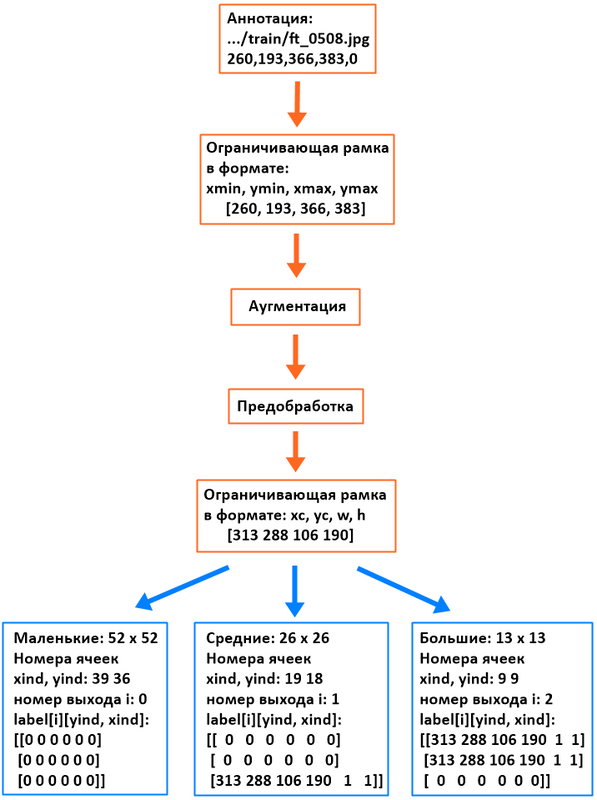

На схеме для примера взяты координаты рамки того же изображения. Как можно заметить, метка объекта записалась в номер выхода сети соответствующий средним и большим размерам объектов. В среднем выходе есть пересечение выше порогового с третим якорем, а в большом с первым и вторым якорем. 

Вот размеры якорей: 

[[[10,  13], [16,   30], [33,   23]],

[[30,  61], [62,   45], [59,  119]],

[[116, 90], [156, 198], [373, 326]]]

Текущая рамка имеет ширину 106 и высоту 190. 

Ниже нарисованы якоря в том же масштабе, что и ограничивающая рамка.

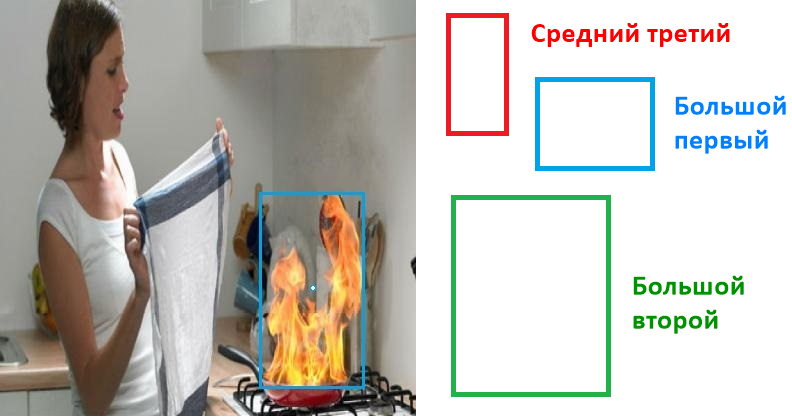

Ниже показаны демонстрационные изображения разделения изображения сеткой на ячейки в зависимости от выхода сети, и указаны центры объекта.

Пример изображения с нанесённой разделительной сеткой для маленьких объектов. Размер сетки 52 на 52 ячейки. Центр объекта находится в ячейке с координатами x: 39, y: 36.

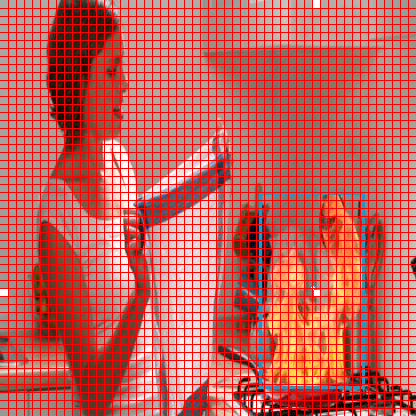

Изображение с разделительной сеткой для средних объектов. Размер сетки 26 на 26 ячеек. Центр объекта находится в ячейке с координатами x: 19, y: 18.

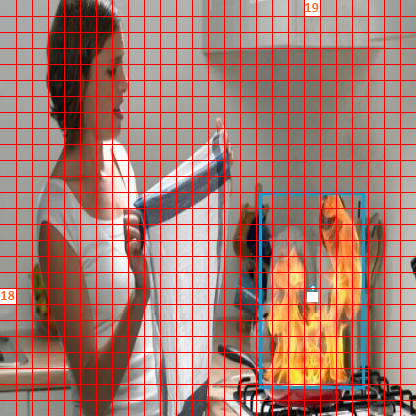

Изображение с разделительной сеткой для болльших объектов. Размер сетки 13 на 13 ячеек. Центр объекта находится в ячейке с координатами x: 9, y: 9.

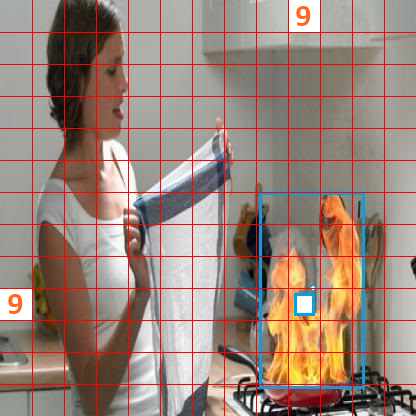

# Функция потерь.

В большинстве обучаемых сетей ошибка рассчитывается как разница между фактическим выходным значением y и прогнозируемым выходным значением ŷ. Функция, используемая для вычисления этой ошибки, известна как функция потерь, также часто называемая функцией ошибки или затрат. Функция потерь - это числовая характеристика качества работы модели. Чем ниже значение функции потерь (ошибки), тем больше выход модели похож на правильную метку, и наоборот. Если значение функции потерь довольно высокое, значит наша модель прогнозирует не очень хорошо и требует доработки или дообучения. Без функции потерь не возможно обучение, так как оно заключается в оптимизации параметров модели, чтобы минимизировать значения ошибки. Существует очень много разных видов функций потерь. Их использование зависит от задачи, например, для задачи регрессии в качестве функции потерь часто используется среднеквадратическая ошибка mse. А в задачах класификации используется перекрёстная энтропия.

Технология yolo объединяет в себе как задачу классификации, это классификация объектов, так и задачу регрессиии, это определение числовых параметров ограничивающей рамки. Сеть yolo прогнозирует несколько ограничивающих рамок для каждой ячейки разделительной сетки каждого выхода модели. Чтобы вычислить потери для истинного положительного результата, нам нужно выбрать только одну рамку, которая отвечает за объект. Для этого мы выбираем ту рамку, у которой самый высокий коэфициент пересечения IoU с истиной меткой. 

Общая ошибка модели yolo включает в себя 3 состовляющие:


1.   Ошибка определения параметров ограничивающей рамки объекта.
2.   Ошибка определения есть ли объект в ограничивающей рамке или нет.
3.   Ошибка определения класса объекта.



In [ ]:
# Функция расчёта функциий потерь.
def compute_loss(pred, conv, label, bboxes, i=0, CLASSES=COCO_CLASSES):
    # pred - предсказание сети с декодированного выхода.
    # conv - предсказание сети с выхода свёрточной части.
    # label - полные правильные метки.
    # bboxes - метки правльных ограничивающих рамок.
    # i - номер выхода сети.
    # CLASSES - путь к файлу со списком клссов.
    
    # Форма тензоров предсказания pred 
    # декодированого выхода сети:
    # i = 0 -> (batch_size, 52, 52, 3, 5+num_classes)
    # i = 1 -> (batch_size, 26, 26, 3, 5+num_classes)
    # i = 2 -> (batch_size, 13, 13, 3, 5+num_classes)
    
    # Форма тензоров предсказания conv 
    # свёрточного выхода сети:
    # i = 0 -> (batch_size, 52, 52, 3 * 5+num_classes)
    # i = 1 -> (batch_size, 26, 26, 3 * 5+num_classes)
    # i = 2 -> (batch_size, 13, 13, 3 * 5+num_classes)
    
    # Форма общих правильных меток label совпадает 
    # с формой декодированных выходов.
    
    # Форма правильных меток рамок bboxes имеет форму:
    # (batch_size, макс кол-во рамок на выход, 4 координаты x y w h).
    # ------------------------------------------
    
    # Считываем файл с указанными классами,
    # чтобы получить их количество.
    NUM_CLASS = len(read_class_names(CLASSES))
    
    # Сохраняем форму тензора свёрточного выхода.
    conv_shape  = tf.shape(conv)
   
    # Сохраняем значение размера пакета.
    batch_size = conv_shape[0]
    
    # Сохраняем значение количества делений сетки 
    # изображения в зависимости от номера выхода сети:
    output_size = conv_shape[1]
    # для маленьких объектов: i = 0 output_size = 52
    # для средних объектов:   i = 1 output_size = 26
    # для больших объектов:   i = 2 output_size = 13
    
    # Вычисляем размер входа модели.
    # Размер входа вычисляем через размер ячейки
    # сетки изображения в пикселях и количества 
    # делений сетки в зависимости от выхода сети.
    # Во всех случаях это будет input_size = 416.
    # [8, 16, 32] * [52, 26, 13] = [416, 416, 416]
    input_size  = STRIDES[i] * output_size
    
    # Приводим форму тензоров выходов свёрточной части сети с 
    # (batch_size, output_size, output_size, 3 * 5+num_classes) -> 
    # -> (batch_size, output_size, output_size, 3, 5+num_classes)
    conv = tf.reshape(conv, (batch_size, output_size, output_size, 3, 5 + NUM_CLASS))
    # ------------------------------------------
    
    # Вытаскиеваем значения отдельно.
    # Уверенность в том, что в ограничивающей рамке есть 
    # объект в предсказании сети свёрточного выхода.
    conv_raw_conf = conv[:, :, :, :, 4:5]
    # Формой (batch_size, output_size, output_size, 3, 1)

    # Вероятности классов объектов в 
    # свёрточном выходе сети.
    conv_raw_prob = conv[:, :, :, :, 5:]
    # Формой (batch_size, output_size, output_size, 3, num_classes)

    # Координаты центра, ширина и высота ограничивающей 
    # рамки в декодированом выходе сети.
    pred_xywh = pred[:, :, :, :, 0:4]
    # Формой (batch_size, output_size, output_size, 3, 4)
    
    # Уверенность в том, что в ограничивающей рамке есть 
    # объект в декодированом выходе сети.
    pred_conf = pred[:, :, :, :, 4:5]
    # Формой (batch_size, output_size, output_size, 3, 1)
    
    # Координаты центра, ширина и высота  
    # ограничивающей рамки в полной метке.
    label_xywh = label[:, :, :, :, 0:4]
    # Формой (batch_size, output_size, output_size, 3, 4)
    
    # Уверенность в том, что в ограничивающей  
    # рамке есть объект в полной метке.
    respond_bbox = label[:, :, :, :, 4:5]
    # Формой (batch_size, output_size, output_size, 3, 1)
    
    # Вероятности классов объектов
    # в полной метке.
    label_prob = label[:, :, :, :, 5:]
    # Формой (batch_size, output_size, output_size, 3, num_classes)
    # ------------------------------------------
    
    # Вычисляем обобщённый коэффициент пересечения двух
    # рамок: предсказанной сетью и правильной с метки.
    # К полученому тензору добавляем ещё одну ось в конце,
    # чтобы форма тензора совпадала с остальными.
    giou = tf.expand_dims(bbox_giou(pred_xywh, label_xywh), axis=-1)
    # Получившаяся форма тензора: (batch_size, output_size, output_size, 3, 1).
    
    # Приводим значение размера входа сети к типу 
    # с плавающей запятой: 416 -> float32.
    input_size = tf.cast(input_size, tf.float32)

    # Расчитываем коэффициент масштаба корректировки ошибки.
    # Чем больше площадь ограничивающей рамки, тем меньше ошибка.
    # Это нужно для того, чтобы заставить сеть более точно 
    # определять параметры рамки мелких объектов.
    # 2 - (w * h / 416)^2
    bbox_loss_scale = 2.0 - 1.0 * label_xywh[:, :, :, :, 2:3] * label_xywh[:, :, :, :, 3:4] / (input_size ** 2)
    
    # Расчитываем значение функции потерь определения 
    # параметров ограничивающей рамки. Выбираем рамки, 
    # в которых в полной метке есть объект. Умножаем 
    # единица минус значение обобщённого коэффициента 
    # пересечения на коэффициент масштаба корректировки ошибки.
    giou_loss = respond_bbox * bbox_loss_scale * (1 - giou)
    
    # Вычисляем коэффициенты пересечения предсказанных 
    # параметров рамок с правильными метками рамок.
    iou = bbox_xywh_iou(pred_xywh[:, :, :, :, np.newaxis, :], 
                        bboxes[:, np.newaxis, np.newaxis, np.newaxis, :, :])
    # (batch_size, output_size, output_size, 3,   1, 4) # предсказанные рамки
    # (batch_size,           1,           1, 1, 100, 4) # правильные метки рамок
    # (batch_size, output_size, output_size, 3, 100) # форма результирующего iou

    # Находим максимальное значение пересечения 
    # правильных меток рамок с предказанными рамками. 
    # В конец полученного тензора добаляем ещё одну ось.
    max_iou = tf.expand_dims(tf.reduce_max(iou, axis=-1), axis=-1)
    # Получаем тензор формой: (batch_size, output_size, output_size, 3, 1)
   
    # Вычислим какие ячейки разделительной сетки 
    # изображения относятся к фону, то есть не содержат 
    # объекты. Если наибольшее значение коэффициента 
    # пересечения iou меньше порога, считается, что ячейка 
    # не содержит объекты. Для этого значения проверки 
    # максимальное значение коэффициента пересечения меньше 
    # порога приводим к 0 и 1, и умножаем на 1 - уверенность
    # в том, что в рамке в правильной общей метке есть объект.
    # Для ячеек фона:
    # iou меньше порога -> 1 - фон    * (1 - conf_label)
    # iou меньше порога -> 0 - объект = 0
    respond_bgd = (1.0 - respond_bbox) * tf.cast(max_iou < IOU_LOSS_THRESH, tf.float32)
    # ------------------------------------------

    # Рассчитаем квадраты ошибок предсказания 
    # уверенности присутствия объектов в рамках.
    conf_focal = tf.pow(respond_bbox - pred_conf, 2)
    
    # Рассчитаем значение функции потерь 
    # уверенности нахождения объекта в рамке. 
    # Эта ошибка будет состоять из трёх частей: 
    # квадрата ошибок предсказания уверенности 
    # присутствия объектов в рамках, умноженого 
    # на два варианта предсказания. Первый вариант: 
    # модель предказала что внутри рамки есть объект,
    # а на самом деле там может быть объект, или его 
    # не будет. Во втором варианте, модель предсказала, 
    # что внутри рамки нет объекта, а в реальности там 
    # есть объект, или его нет. Поэтому для более точного 
    # вычисления ошибки мы учитываем все эти возможные 
    # ситуации в выражении ниже. С начала мы считаем 
    # бинарную кросс энтропию для тех рамок, где модель 
    # спрогнозировала, что объект есть внутри, и мы 
    # проверяем сколько раз модель правильно и не 
    # правильно сделала предсказание. Потом мы выбираем 
    # фоновые рамки, то есть те, где нет объектов, и 
    # также подсчитываем сколько модель ошиблась в 
    # прогнозе, и правильно предсказала. Для расчёта 
    # ошибки предсказания мы используем бинарную 
    # перекрёстную энтропию. Это мера расстояния между 
    # распределениями вероятностей, или в данном 
    # случае — между правильными метками и предсказаниями. 
    # Точнее в данном случае мы используем сигмоидную 
    # перекрестную энтропию с логитами, потому что она 
    # позволяет измерить вероятностную ошибку в задачах 
    # дискретной классификации, в которых каждый класс 
    # независим и не является взаимоисключающим. Как в 
    # нашей задаче object detection, когда на одном 
    # изображении может одновременно находится несколько 
    # независимых объектов. Например, на изображении 
    # может одновременно находится и человек, и автомобиль, 
    # и другие. Их присутствие не зависит друг от друга.
    
    conf_loss = conf_focal * (
                respond_bbox * 
                tf.nn.sigmoid_cross_entropy_with_logits(labels=respond_bbox, 
                                                        logits=conv_raw_conf)
                +
                respond_bgd * 
                tf.nn.sigmoid_cross_entropy_with_logits(labels=respond_bbox, 
                                                        logits=conv_raw_conf))
    # Для этого же мы могли бы использовать 
    # tf.losses.sigmoid_cross_entropy, которая делает 
    # тоже самое, но она возвращает одно скалярное значение,
    # в отличие от tf.nn.sigmoid_cross_entropy_with_logits, 
    # которая возвращает значения для каждой ячейки 
    # разделительной сетки. Результрующая форма тензора: 
    # (batch_size, output_size, output_size, 3, 1).  
    # Это нужно чтобы иметь возможность перемножить результат 
    # с маской ячеек с объектами или с фоном.
    # ------------------------------------------
    
    # Вычисляем вероятности каждого класса объектов.
    # Для этого также используем сигмоидную перекрестную 
    # энтропию, чтобы определить вероятности независимых классов. 
    # Выбираем только те ячейки, в которых есть объекты.
    prob_loss = respond_bbox * \
                tf.nn.sigmoid_cross_entropy_with_logits(labels=label_prob, 
                                                        logits=conv_raw_prob)
    # Тензор также имеет форму: 
    # (batch_size, output_size, output_size, 3, 1).
    # ------------------------------------------   
    
    # Теперь после всех математических операций нам 
    # нужно получить одно значение с каждой функции 
    # потерь по пакету данных. Для этого просуммируем 
    # значения каждой функции потерь по всем осям, 
    # кроме оси batch_size. В итоге мы получим суммы 
    # ошибок по ячейкам для каждого изображения в пакете. 
    # Далее мы берём среднее значение ошибки по пакету изображений.
    # В итоге получаем три значения loss: giou, conf, prob.
    # Трансформация формы результирующего тензора:
    # (batch_size, output_size, output_size, 3, 1) -> (batch_size) -> (1).
    
    giou_loss = tf.reduce_mean(tf.reduce_sum(giou_loss, axis=[1,2,3,4]))
    conf_loss = tf.reduce_mean(tf.reduce_sum(conf_loss, axis=[1,2,3,4]))
    prob_loss = tf.reduce_mean(tf.reduce_sum(prob_loss, axis=[1,2,3,4]))

    # Возвращаем полученные значения функций потерь.
    return giou_loss, conf_loss, prob_loss

Поскольку обычный коэффициент пересечения (или коэффициент Жаккара) IoU - это понятие отношения, оно нечувствительно к масштабу целевого объекта. Используя IoU как метрику для вычисления функции потерь определения параметров ограничивающей рамки модель не может напрямую оптимизировать рамки, которые не пересекаются. Для этого используется обобщённый коэффициент пересечения. Есть ещё более продвинутые метрики оценки на сколько одна рамка похожа на другую, которые учитывают ещё и расстояние между центрами, и отношение сторон. Их мы рассмотрим в следующих уроках. Вот формула вычисления обобщённого коэффициента пересечения.

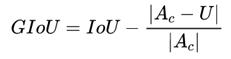

In [ ]:
# Функция для расчёта обобщённого коэффициента 
# пересечения двух ограничивающих рамок.
def bbox_giou(boxes1, boxes2):

    # Переводим формат ограничивающих рамок.
    # x y w h -> xmin ymin xmax ymax
    # xmin = x - w/2, ymin = y - h/2
    # xmax = x + w/2, ymax = y + h/2
    boxes1 = tf.concat([boxes1[..., :2] - boxes1[..., 2:] * 0.5,
                        boxes1[..., :2] + boxes1[..., 2:] * 0.5], axis=-1)
    boxes2 = tf.concat([boxes2[..., :2] - boxes2[..., 2:] * 0.5,
                        boxes2[..., :2] + boxes2[..., 2:] * 0.5], axis=-1)

    # Берем минимальные и максимальные значения из координат
    # ((xmin, ymin), (xmax, ymax)) каждой рамки и объединяем их. 
    # Это нужно делать, чтобы исключить возможность 
    # неправильного определения пересечения рамок.
    boxes1 = tf.concat([tf.minimum(boxes1[..., :2], boxes1[..., 2:]),
                        tf.maximum(boxes1[..., :2], boxes1[..., 2:])], axis=-1)
    boxes2 = tf.concat([tf.minimum(boxes2[..., :2], boxes2[..., 2:]),
                        tf.maximum(boxes2[..., :2], boxes2[..., 2:])], axis=-1)
    
    # Вычисляем площади ограничивающих прямоугольников.
    # S = (xmax-xmin = w) * (ymax-ymin = h)
    boxes1_area = (boxes1[..., 2] - boxes1[..., 0]) * (boxes1[..., 3] - boxes1[..., 1])
    boxes2_area = (boxes2[..., 2] - boxes2[..., 0]) * (boxes2[..., 3] - boxes2[..., 1])

    # Вычисляем какой рамки выбрать левый верхний угол.
    # max((xmin1, ymin1), (xmin2, ymin2))
    left_up = tf.maximum(boxes1[..., :2], boxes2[..., :2])
    # Вычисляем какой рамки выбрать правый нижний угол.
    # min((xmax1, ymax1), (xmax2, ymax2))
    right_down = tf.minimum(boxes1[..., 2:], boxes2[..., 2:])

    # Проверяем пересекаются ли рамки.
    # (xmax, ymax) - (xmin, ymin)
    inter_section = tf.maximum(right_down - left_up, 0.0)
    
    # Расчитываем площадь пересечения.
    inter_area = inter_section[..., 0] * inter_section[..., 1]
    
    # Вычисляем площадь объединения.
    union_area = boxes1_area + boxes2_area - inter_area

    # Вычисляем отношение площади пересечения к 
    # площади объединения (коэффициент Жаккара).
    iou = inter_area / union_area

    # Рассчитываем координаты левого верхнего угла и 
    # правого нижнего угла прямоугольника, который 
    # будет перекрывать обе эти рамки и будет 
    # иметь минимально возможную площадь.
    # Левый верхний угол:
    # min((xmin1, ymin1), (xmin2, ymin2))
    enclose_left_up = tf.minimum(boxes1[..., :2], boxes2[..., :2])
    # Правый нижний угол:
    # max((xmax1, ymax1), (xmax2, ymax2))
    enclose_right_down = tf.maximum(boxes1[..., 2:], boxes2[..., 2:])
    
    # Проверяем правильно ли выбран перекрывающий прямоугольник. 
    # Если разность координат правого нижнего угла и левого 
    # верхнего угла положительная, то всё выбрано правильно.
    enclose = tf.maximum(enclose_right_down - enclose_left_up, 0.0)

    # Посчитаем площадь перекрывающего прямоугольника.
    enclose_area = enclose[..., 0] * enclose[..., 1]
 
    # Вычислим обобщённый коэффициент пересечения по формуле.
    # Из площади перекрывающего прямоугольника вычитаем площадь 
    # объединения и делим на площадь перекрывающего прямоугольника. 
    # Это отношение мы вычитаем из коэффициента пересечения.
    giou = iou - 1.0 * (enclose_area - union_area) / enclose_area

    # Возвращаем расчитанный обобщённый коэффициент пересечения.
    return giou

Вот изображение с демонстрацией расчёта GIoU. Здесь суть формулы такая же, только представлена другими составляющими.

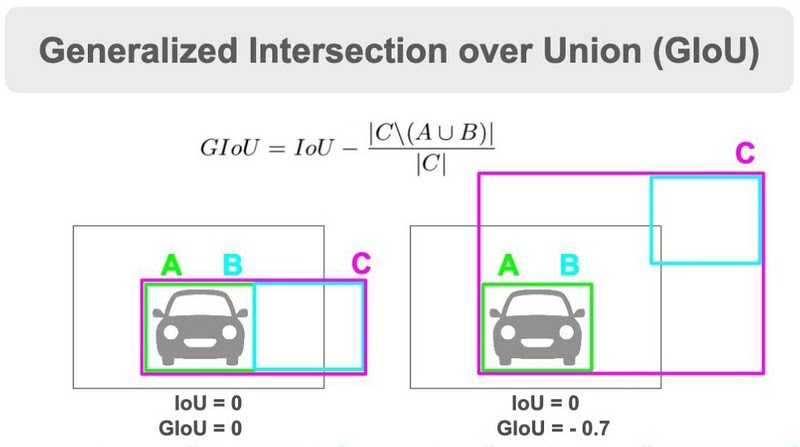

# Процесс обучения сети.

Зададим функцию, в которой будет происходить весь процесс обучения модели: все манипуляции с данными и моделью, смена эпох, шаг обучения и шаг проверки, сохранение модели.

In [ ]:
# Функция для обучения модели.
def main():
    # Обучение с контрольной точки.
    # Делаем переменную глобальной, 
    # чтобы сохранилось изменение значения.
    global FROM_CHECKPOINT
    
    # Если уже существует папка 
    # для записи логов обучения,
    if os.path.exists(LOGDIR): 
        # то очищаем её полностью.
        shutil.rmtree(LOGDIR)
        
    # Создадим средство для записи 
    # информации по процессу обучения.
    writer = tf.summary.create_file_writer(LOGDIR)

    # Создадим экземпляры классов наборов 
    # данных для обучения и проверки.
    trainset = Dataset('train')
    testset = Dataset('test')

    # Вычислим количество шагов 
    # обучения за одну эпоху.
    steps_per_epoch = len(trainset)
    
    # Инициализируем счётчик шагов обучения.
    # Один шаг обучения равен одному пакету.
    global_steps = tf.Variable(1, trainable=False, dtype=tf.int64)

    # Если установлен флаг использования 
    # предобученых весов.
    if TRAIN_TRANSFER:
        # Создаём модель для загрузки весов.
        Darknet = Create_Yolo(input_size=INPUT_IMG_SIZE, CLASSES=COCO_CLASSES)
        # Загружаем оригинальные веса yolov3 с помощью своей 
        # функции для загрузки весов формата darknet.
        load_yolo_weights(Darknet, YOLO_V3_WEIGHTS)

    # Создаём основную модель со своими классами, которую будем обучать.
    yolo = Create_Yolo(input_size=INPUT_IMG_SIZE, training=True, CLASSES=CLASSES_PATH)
    
    # Если нужно продолжить обучение
    # с контрольной точки.
    if FROM_CHECKPOINT:
        try:
            # Пробуем загрузить веса контрольной точки в формате tf.
            yolo.load_weights(f"Checkpoints/{MODEL_NAME}")
        except ValueError:
            print("Формы тензоров весов контрольной точки и созданной модели несовместимы")
            # Сбрасываем флаг обучения с контрольной точки,
            # чтобы загрузить оригинальные веса.
            FROM_CHECKPOINT = False

    # Если нужно использовать предобученые веса 
    # и не будем обучать с контрольной точки.
    if TRAIN_TRANSFER and not FROM_CHECKPOINT:
        # Перебираем слои созданной модели
        # с оригинальными весами yolov3.
        for i, l in enumerate(Darknet.layers):
            # Получаем веса слоя. 
            layer_weights = l.get_weights()
            # Если слой имеет веса,
            if layer_weights != []:
                try:
                    # то пробуем загрузить полученные веса в 
                    # такой же слой по индексу основной 
                    # модели, которую будем обучать.
                    yolo.layers[i].set_weights(layer_weights)
                
                # Если форма тензоров весов не совпадает,
                except:
                    # тогда пропускаем этот слой.
                    print("skipping", yolo.layers[i].name)
    
    # Устанавливаем оптимизатор Adam и указываем скорость обучения.
    optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

    # Определим функцию шага обучения.
    def train_step(image_data, target):
        # На вход функция требует пакет подготовленных
        # изображений и правильных меток.
        
        # Запускаем запись операций для 
        # автоматического дифференцирования.
        with tf.GradientTape() as tape:
            # Пропускаем через модель в режиме обучения 
            # пакет изображений и получаем предсказание сети.
            pred_result = yolo(image_data, training=True)
            
            # Начальные значения переменных функций 
            # потерь присваиваем нулю.
            giou_loss=conf_loss=prob_loss=0
            
            # giou_loss - это переменная для хранения значений
            # функции ошибки при предсказании ограничивающей рамки.
            # conf_loss - ... при предсказании показателя уверенности,
            # есть ли объект в ограничивающей рамке.
            # prob_loss - ошибка предсказания класса объекта.
            # total_loss - суммарная ошибка.
            
            # Перебираем номера выходов сети.
            # Три выхода для объектов разного размера.
            for i in range(3):
                # Разделяем предсказание сети на выходы свёрточной
                # части модели и декодированные выходы 
                # для трёх размеров сетки.
                conv, pred = pred_result[i*2], pred_result[i*2+1]
                
                # Расчитываем функцию ошибки исходя из значений предсказаний
                # свёрточных и декодированых выходов, и правильных меток.
                loss_items = compute_loss(pred, conv, *target[i], i, CLASSES=CLASSES_PATH)
                # Разделяем составной результат по своим переменным
                # и прибавляем значения к предыдущим.
                giou_loss += loss_items[0]
                conf_loss += loss_items[1]
                prob_loss += loss_items[2]

            # Вычисляем значение суммарной ошибки.
            total_loss = giou_loss + conf_loss + prob_loss

            # Передаём в автоматический дифференциатор значение 
            # суммарной ошибки и обучаемые переменные модели. 
            # Получаем значения градиентов ошибки узлов модели, 
            # которые нужны для оптимизации.
            gradients = tape.gradient(total_loss, yolo.trainable_variables)
            
            # Передаём в оптимизатор полученные значения градиентов 
            # и обучаемые переменные модели, чтобы минимизировать значение
            # функции потерь путём подстраивания весов модели.
            optimizer.apply_gradients(zip(gradients, yolo.trainable_variables))
            
            # Увеличиваем счётчик шагов обучения на единицу.
            global_steps.assign_add(1)

            # Запишем значения функций ошибок в лог обучения.
            with writer.as_default():
                # tf.summary.scalar("lr", optimizer.lr, step=global_steps)
                tf.summary.scalar("loss/total_loss", total_loss, step=global_steps)
                tf.summary.scalar("loss/giou_loss", giou_loss, step=global_steps)
                tf.summary.scalar("loss/conf_loss", conf_loss, step=global_steps)
                tf.summary.scalar("loss/prob_loss", prob_loss, step=global_steps)
            writer.flush()
            
        # Возвращаем значения функций потерь и счётчика шагов обучения.
        return global_steps.numpy(), giou_loss.numpy(), conf_loss.numpy(), prob_loss.numpy(), total_loss.numpy() # optimizer.lr.numpy(), 

    # Создадим средство для записи 
    # информации по процессу проверки.
    validate_writer = tf.summary.create_file_writer(LOGDIR)
    
    # Определим функцию шага проверки.
    def validate_step(image_data, target):
        # На вход функция также требует пакет подготовленных
        # изображений и правильных меток.
        
        # Запускаем запись операций для 
        # автоматического дифференцирования.
        with tf.GradientTape() as tape:
            # Пропускаем через модель в режиме проверки 
            # пакет изображений и получаем предсказание сети.
            pred_result = yolo(image_data, training=False)
            
            # Начальные значения переменных функций 
            # потерь присваиваем нулю.
            giou_loss=conf_loss=prob_loss=0

            # Перебираем номера выходов сети.
            for i in range(3):
                # Разделяем предсказание сети на выходы свёрточной
                # части модели и декодированные выходы 
                # для трёх размеров сетки.
                conv, pred = pred_result[i*2], pred_result[i*2+1]
                
                # Расчитываем функцию ошибки исходя из значений предсказаний
                # свёрточных и декодированых выходов, и правильных меток.
                loss_items = compute_loss(pred, conv, *target[i], i, CLASSES=CLASSES_PATH)
                # Разделяем составной результат по своим переменным
                # и прибавляем значения к предыдущим.
                giou_loss += loss_items[0]
                conf_loss += loss_items[1]
                prob_loss += loss_items[2]

            # Вычисляем значение суммарной ошибки.
            total_loss = giou_loss + conf_loss + prob_loss
            
        # При проверке мы не модифицируем значения весов, 
        # поэтому нам не нужно минимизировать функцию потерь. 
        # Мы просто возвращвем полученные значения ошибок.
        return giou_loss.numpy(), conf_loss.numpy(), prob_loss.numpy(), total_loss.numpy()
        
    # Переходим к циклу обучения.
    # Задаём начальное значение функции 
    # потерь на проверочном наборе данных. 
    # Оно должно быть изначально большое.
    # Это нужно чтобы сравнивать результат модели на текущей эпохе 
    # с предыдущим и сохранять лучшую модель, если установлен
    # флаг SAVE_BEST_ONLY сохранения только лучшей модели.
    best_val_loss = 1000
    
    # Если установлен флаг SAVE_CHECKPOINT, то веса модели 
    # будут сохраняться по окончанию каждой эпохи.
    
    # Запускаем цикл обучения, 
    # равный количеству заданых эпох.
    for epoch in range(EPOCHS):
        # Перебираем пакеты с изображениями 
        # и метками обучающего набора данных.
        for image_data, target in trainset:
            # Передаём в функцию шага обучения пакет 
            # изображений и меток, и сохраняем результат.
            results = train_step(image_data, target)
            # Вычисляем значение текущего шага внутри эпохи.
            cur_step = results[0]%steps_per_epoch
            
            # Отображаем текущие значения: номер эпохи, сколько
            # пакетов пройдено, ошибки определения координат рамок, 
            # присутствия объекта в рамке и класса объекта.
            print("epoch:{:2.0f} step:{:5.0f}/{}, giou_loss:{:7.2f}, conf_loss:{:7.2f}, prob_loss:{:7.2f}, total_loss:{:7.2f}".format(epoch, cur_step, steps_per_epoch, results[1], results[2], results[3], results[4]))

        # Если проверочный набор данных пустой, 
        if len(testset) == 0:
            # то выводим об этом сообщение,
            print("Проверочный набор данных пустой.")
            # сохраняем контрольную точку и продолжаем обучение.
            yolo.save_weights(os.path.join(CHECKPOINTS_FOLDER, MODEL_NAME))
            continue
        
        # Значения функций потерь в лог мы записывали 
        # по прохождении каждого пакета данных. 
        # При проверке мы будем записывать в лог и 
        # отображать средние значения по всем пакетам
        # по завершении каждой эпохи.
        
        # Присваиваем нулю начальные значения переменных 
        # счётчика шагов проверки и функций потерь.
        count, giou_val, conf_val, prob_val, total_val = 0., 0, 0, 0, 0
        
        # Перебираем пакеты с изображениями 
        # и метками обучающего набора данных.
        for image_data, target in testset:
            # Передаём в функцию шага проверки пакет 
            # изображений и меток, и сохраняем результат.
            results = validate_step(image_data, target)
            # Увеличиваем на единицу счётчик шагов проверки.
            count += 1
            
            # Разделяем составной результат по своим переменным
            # и прибавляем значения к предыдущим.
            giou_val += results[0]
            conf_val += results[1]
            prob_val += results[2]
            total_val += results[3]
            
        # Запишем средние значения функций ошибок в лог проверки.
        with validate_writer.as_default():
            tf.summary.scalar("validate_loss/total_val", total_val/count, step=epoch)
            tf.summary.scalar("validate_loss/giou_val", giou_val/count, step=epoch)
            tf.summary.scalar("validate_loss/conf_val", conf_val/count, step=epoch)
            tf.summary.scalar("validate_loss/prob_val", prob_val/count, step=epoch)
        validate_writer.flush()
            
        # Отображаем текущие средние значения функций потерь.
        print("\n\ngiou_val_loss:{:7.2f}, conf_val_loss:{:7.2f}, prob_val_loss:{:7.2f}, total_val_loss:{:7.2f}\n\n".
              format(giou_val/count, conf_val/count, prob_val/count, total_val/count))

        # Если установлен флаг сохранения после каждой 
        # эпохи и не нужно сохранять лучшую модель.
        if SAVE_CHECKPOINT and not SAVE_BEST_ONLY:
            # Формируем путь и имя файла со значением
            # функции ошибки на проверочном наборе. 
            # Веса будем хранить в формате tf, поэтому не 
            # будем указывать буквенно формат в имени.
            save_directory = os.path.join(CHECKPOINTS_FOLDER, MODEL_NAME+"_val_loss_{:7.2f}".format(total_val/count))
            # Сохраняем веса модели.
            yolo.save_weights(save_directory)
            
        # Если в настройках указали сохранять только
        # лучшую модель. Сохраняем только в том случае, 
        # если значение суммарной функции ошибки на
        # проверочном наборе меньше, чем на предыдущей эпохе.
        if SAVE_BEST_ONLY and best_val_loss > total_val/count:
            # Формируем путь и имя файла для сохранения.
            save_directory = os.path.join(CHECKPOINTS_FOLDER, MODEL_NAME)
            # Сохраняем веса модели под тем же именем (перезапиываем).
            yolo.save_weights(save_directory)
            # Вычисляем текущее лучшее значение
            # ошибки при проверке.
            best_val_loss = total_val/count
        
        # Если оба флага сброшены, то
        if not SAVE_BEST_ONLY and not SAVE_CHECKPOINT:
            # просто формируем путь и сохраняем веса.
            # Перезаписываем после каждой эпохи.
            save_directory = os.path.join(CHECKPOINTS_FOLDER, MODEL_NAME)
            yolo.save_weights(save_directory)


# Начнём обучение модели.

Мы уже задали все необходимые настройки в конфигурационной ячейке. Теперь нужно просто вызвать функцию main и запустится обучение.

Первые 20 эпох обучения.

In [ ]:
# Засекаем время выполнения ячейки.
%%time 

# Очищаем сессию. 
# clear_session удаляет все узлы, оставшиеся от предыдущих моделей, 
# освобождая память и предотвращая замедление. 
clear_session()

# Запускаем обучение.
main()

skipping conv2d_74
skipping conv2d_66
skipping conv2d_58
epoch: 0 step:    2/182, giou_loss:   3.05, conf_loss:1744.16, prob_loss:   2.45, total_loss:1749.66
epoch: 0 step:    3/182, giou_loss:   2.44, conf_loss:1646.61, prob_loss:   1.86, total_loss:1650.90
epoch: 0 step:    4/182, giou_loss:   2.60, conf_loss:1574.87, prob_loss:   1.83, total_loss:1579.30
epoch: 0 step:    5/182, giou_loss:   3.76, conf_loss:1497.19, prob_loss:   2.67, total_loss:1503.62
epoch: 0 step:    6/182, giou_loss:   3.14, conf_loss:1434.15, prob_loss:   2.17, total_loss:1439.46
epoch: 0 step:    7/182, giou_loss:   1.92, conf_loss:1365.14, prob_loss:   1.29, total_loss:1368.35
epoch: 0 step:    8/182, giou_loss:   3.82, conf_loss:1317.23, prob_loss:   2.27, total_loss:1323.31
epoch: 0 step:    9/182, giou_loss:   3.07, conf_loss:1249.54, prob_loss:   1.82, total_loss:1254.43
epoch: 0 step:   10/182, giou_loss:   2.49, conf_loss:1195.40, prob_loss:   1.78, total_loss:1199.66
epoch: 0 step:   11/182, giou_loss

Посмотрим на значения функций потерь. Мы используем модель с предобучеными весами, поэтому сеть в целом уже умеет классифицировать объекты и выделять их ограничивающим прямоугольником, ей только нужно дообучится под конкретную задачу, найти особенности, характерные для объектов данного датасета. Этим и объясняется относительно небольшое значение функции потерь определения ограничивающей рамки объекта сразу со старта обучения. Также значение ошибки определения класса объектов имеет небольшое значение, потому что всего лишь один класс, здесь особо не ошибёшься. Если было бы больше классов, значение функции потерь было бы значительно выше. В данном случае основу общей функнции потерь составляет ошибка определения есть или нет объекта внутри рамки. 

Мы установили относительно большую скорость обучения, поэтому уже к концу первой эпохи значение общей функции потерь на наборе для обучения снизилось с примерно 1700 до 40. Если обратить внимание на значение общей ошибки на проверочном наборе, то поначалу ошибка значительно падает, а после 10той эпохи значение колеблится около 6. Аугментация приносит небольшие улучшения, но этого недостаточно. Лучше всего было бы, если сеть получила бы достаточное количество образцов для обучения и проверки, и образцы были наиболее разнообразны. Но не всегда есть такая возможность. Что мы можем ещё сделать помимо аугментации, это уменьшить скорость обучения, что позволит оптимизатору ниже опуститься в минимум.

Уменьшаем скорость обучения и запускаем процесс ещё на 20 эпох. Загружаем контрольную точку с прошлого периода.

Вторые 20 эпох.

In [ ]:
# Засекаем время выполнения ячейки.
%%time 

# Обучение с контрольной точки.
FROM_CHECKPOINT    = "Checkpoints/fire_yolov3"
# Скорость обучения.
LEARNING_RATE      = 0.00005
# Количество эпох.
EPOCHS             = 20

# Очищаем сеанс.
clear_session()

# Запускаем обучение.
main()

epoch: 0 step:    2/182, giou_loss:   1.73, conf_loss:   0.48, prob_loss:   0.00, total_loss:   2.21
epoch: 0 step:    3/182, giou_loss:   3.03, conf_loss:   1.60, prob_loss:   0.01, total_loss:   4.63
epoch: 0 step:    4/182, giou_loss:   0.92, conf_loss:   0.42, prob_loss:   0.00, total_loss:   1.34
epoch: 0 step:    5/182, giou_loss:   0.89, conf_loss:   0.65, prob_loss:   0.00, total_loss:   1.54
epoch: 0 step:    6/182, giou_loss:   2.38, conf_loss:   0.82, prob_loss:   0.00, total_loss:   3.20
epoch: 0 step:    7/182, giou_loss:   0.94, conf_loss:   0.63, prob_loss:   0.00, total_loss:   1.56
epoch: 0 step:    8/182, giou_loss:   1.62, conf_loss:   1.21, prob_loss:   0.00, total_loss:   2.83
epoch: 0 step:    9/182, giou_loss:   1.72, conf_loss:   0.80, prob_loss:   0.00, total_loss:   2.53
epoch: 0 step:   10/182, giou_loss:   2.56, conf_loss:   0.79, prob_loss:   0.01, total_loss:   3.35
epoch: 0 step:   11/182, giou_loss:   1.27, conf_loss:   1.91, prob_loss:   0.00, total_los

Значение total_val_loss также колеблится около 6. Уменьшаем скорость обучения. И ставим ещё на 10 эпох.

In [ ]:
%%time 

# Обучение с контрольной точки.
FROM_CHECKPOINT    = "Checkpoints/fire_yolov3"
# Скорость обучения.
LEARNING_RATE      = 0.00001
# Количество эпох.
EPOCHS             = 10

clear_session()
main()

epoch: 0 step:    2/182, giou_loss:   1.22, conf_loss:   0.03, prob_loss:   0.00, total_loss:   1.26
epoch: 0 step:    3/182, giou_loss:   2.60, conf_loss:   0.31, prob_loss:   0.00, total_loss:   2.91
epoch: 0 step:    4/182, giou_loss:   2.45, conf_loss:   0.33, prob_loss:   0.00, total_loss:   2.78
epoch: 0 step:    5/182, giou_loss:   1.08, conf_loss:   0.17, prob_loss:   0.00, total_loss:   1.25
epoch: 0 step:    6/182, giou_loss:   1.79, conf_loss:   0.46, prob_loss:   0.00, total_loss:   2.25
epoch: 0 step:    7/182, giou_loss:   0.61, conf_loss:   0.07, prob_loss:   0.00, total_loss:   0.68
epoch: 0 step:    8/182, giou_loss:   1.08, conf_loss:   0.13, prob_loss:   0.00, total_loss:   1.20
epoch: 0 step:    9/182, giou_loss:   1.00, conf_loss:   0.22, prob_loss:   0.00, total_loss:   1.22
epoch: 0 step:   10/182, giou_loss:   1.09, conf_loss:   0.19, prob_loss:   0.00, total_loss:   1.29
epoch: 0 step:   11/182, giou_loss:   0.76, conf_loss:   0.30, prob_loss:   0.00, total_los

Ошибка total_val_loss совсем немного улучшилась. Попробуем ещё уменьшить шаг обучения. Финальные 10 эпох.

In [ ]:
%%time 

# Обучение с контрольной точки.
FROM_CHECKPOINT    = "Checkpoints/fire_yolov3"
# Скорость обучения.
LEARNING_RATE      = 0.000001
# Количество эпох.
EPOCHS             = 10

clear_session()
main()

epoch: 0 step:    2/182, giou_loss:   0.61, conf_loss:   0.05, prob_loss:   0.00, total_loss:   0.67
epoch: 0 step:    3/182, giou_loss:   0.75, conf_loss:   0.03, prob_loss:   0.00, total_loss:   0.78
epoch: 0 step:    4/182, giou_loss:   0.81, conf_loss:   0.05, prob_loss:   0.00, total_loss:   0.85
epoch: 0 step:    5/182, giou_loss:   2.32, conf_loss:   0.17, prob_loss:   0.00, total_loss:   2.49
epoch: 0 step:    6/182, giou_loss:   0.96, conf_loss:   0.55, prob_loss:   0.00, total_loss:   1.52
epoch: 0 step:    7/182, giou_loss:   1.27, conf_loss:   0.45, prob_loss:   0.00, total_loss:   1.73
epoch: 0 step:    8/182, giou_loss:   1.53, conf_loss:   0.21, prob_loss:   0.00, total_loss:   1.75
epoch: 0 step:    9/182, giou_loss:   1.80, conf_loss:   0.20, prob_loss:   0.00, total_loss:   1.99
epoch: 0 step:   10/182, giou_loss:   1.21, conf_loss:   0.17, prob_loss:   0.00, total_loss:   1.38
epoch: 0 step:   11/182, giou_loss:   2.35, conf_loss:   2.09, prob_loss:   0.00, total_los

Уменьшение скорости обучения принесло ещё небольшое улучшение до 5.75. Как мы установили, программа сохранит наилучшую модель по значению total_val_loss. Скорее всего на данном наборе данных не получится достич ещё более внушительных результатов. Стратегия ступенчатого изменения шага скорости обучения более простая в реализации, но она не даёт возможность выжать максимум результата. Если отбросить остальные ухищрения, то 
для достижения лучших показателей незатратным и простым способом является 
плавное измененение скорости обучения. Оно даёт ещё дополнительные 3-5% улучшения по метрике mAP. За метрику mAP и продвинутые способы улучшения  обнаружения yolo мы поговорим в следующих уроках.

# Сохранение модели.

После завершения обучения создадим модель yolo и загрузим в неё веса последнего чекпоинта обучения и сохраним модель.

In [ ]:
# Создаём модель yolo
yolo = Create_Yolo(input_size=INPUT_IMG_SIZE, CLASSES=CLASSES_PATH)
# и загружаем в неё веса последней контрольной точки.
yolo.load_weights("Checkpoints/yolov3_fire")

# Ниже вы можете раскоментировать код и загрузить 
# в модель веса модели, которая обучалась 100 эпох с 
# аугментацией данных и плавным снижением скорости обучения.
# yolo = Create_Yolo(input_size=INPUT_IMG_SIZE, CLASSES=CLASSES_PATH)
# yolo.load_weights("Model_data/yolov3_fire_weights.h5")

Сохраним полностью всю модель с загружеными весами.

In [ ]:
yolo.save('yolov3_fire_model_best.hdf5')

# Проверка качества работы модели.

Загрузим эту же модель, чтобы проверить как сохранилась сеть и на скольо хорошо она находит и выделяет пламя.

In [ ]:
# Для чистоты проверки удалим текущую модель
del yolo
# и очистим сессию.
clear_session()

In [ ]:
# Загружаем сохранённую модель.
yolo = load_model('yolov3_fire_model_best.hdf5')

Проверим на тестовом наборе.

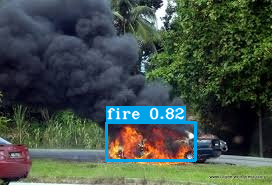

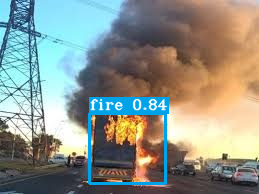

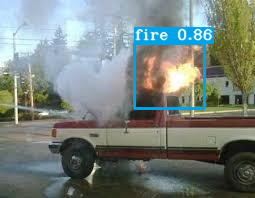

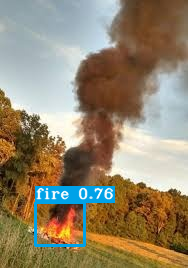

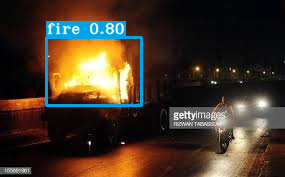

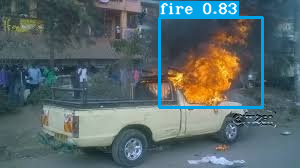

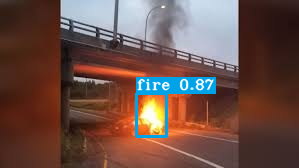

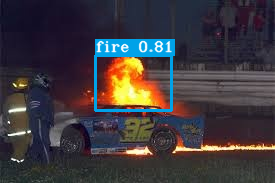

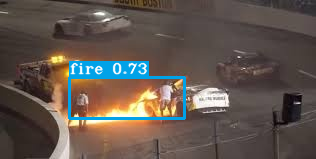

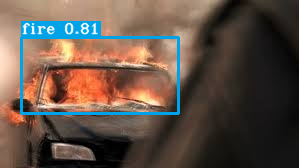

In [ ]:
# Загрузим список примеров изображений из тестового набора.
demo_dir = dataset_train_dir
images_path_list = [f for f in os.listdir(demo_dir) if os.path.isfile(os.path.join(demo_dir, f))]
images_path_list.sort()

# Подадим на вход сети каждое изображение и 
# отобразим ограничивающие рамки найденных обектов.
for image_path in images_path_list[:10]:
    # Путь к изображению.
    image_path = os.path.join(demo_dir, image_path)

    # Так как у нас один класс объектов, то определим 
    # цвет ограничивающей рамки и текста метки.
    image = detect_image(yolo, image_path, input_size=INPUT_IMG_SIZE, CLASSES=CLASSES_PATH, text_color=(255, 255, 255), rectangle_colors=(232, 162, 0))
    
    # Отобразим полученное изображение.
    cv2_imshow(image)

Как можно заметить, модель очень хорошо обнаруживает и выделяет пламя. Поздравляю, у нас получилось! Мы обучили свою собственную сеть yolo, которая очень хорошо справляется со своей задачей и имеет практическую ценность. Такое приложение может значительно улучшить существующие системы предупреждения пожаров или же стать неплохой дешёвой альтернативой. 

В этом уроке мы разобрали основные принципы, на которых строится обучение модели yolo. Есть ещё много интересных улучшений как со стороны изменения архитектуры сети, продвинутых метрик оценки ошибок, так и со стороны постобработки предсказания сети, что мы и рассмотрим в следующих уроках.